# Context

# Stroke Prediction Dataset
Available at: https://www.kaggle.com/fedesoriano/stroke-prediction-dataset

According to the World Health Organization (WHO) stroke is the 2nd leading cause of death globally, responsible for approximately 11% of total deaths.
This dataset is used to predict whether a patient is likely to get stroke based on the input parameters like gender, age, various diseases, and smoking status. Each row in the data provides relavant information about the patient.

## Attribute Information
1) id: unique identifier

2) gender: "Male", "Female" or "Other"

3) age: age of the patient

4) hypertension: 0 if the patient doesn't have hypertension, 1 if the patient has hypertension

5) heart_disease: 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease

6) ever_married: "No" or "Yes"

7) work_type: "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"

8) Residence_type: "Rural" or "Urban"

9) avg_glucose_level: average glucose level in blood

10) bmi: body mass index

11) smoking_status: "formerly smoked", "never smoked", "smokes" or "Unknown"*

12) stroke: 1 if the patient had a stroke or 0 if not

*Note: "Unknown" in smoking_status means that the information is unavailable for this patient

## Acknowledgements
(Confidential Source) - Use only for educational purposes
If you use this dataset in your research, please credit the author.

## Other Datasets
Hepatitis C Dataset: LINK

# Libraries

In [583]:
# jupyter core
from IPython.core.display      import display, HTML
from IPython.display           import Image

# data imports
import pandas.io.sql as psql
import psycopg2 as pg

# data manipulation
import inflection
import datetime
import math
import random
import numpy as np
import pandas as pd
from scipy import stats as ss

# EDA
import pandas_profiling as pr
import seaborn as sns
import matplotlib.pyplot as plt

# preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder

# balancing response variable
from imblearn import combine as c

# feature selection
import boruta as bt

# ML models
from sklearn import model_selection as ms
from sklearn import linear_model as lm
from sklearn import neighbors as nh
from sklearn import ensemble as en
from sklearn import svm
from sklearn import tree
from catboost import CatBoostClassifier
from xgboost import XGBClassifier

# metrics
from sklearn import metrics as m
import scikitplot as skplt
from yellowbrick.features import ParallelCoordinates
from yellowbrick.classifier import ClassificationReport, ConfusionMatrix, ROCAUC, PrecisionRecallCurve
from yellowbrick.contrib.wrapper import wrap

# Functions

In [741]:
# jupyter setup
def jupyter_settings():
    
    # jupyter core settings
    display(HTML("<style>.container { width:100% !important; }</style>"))
    !pylab inline
    
    # pandas
    pd.set_option('display.max_rows', 500)
    pd.set_option('display.max_columns', 500)
    pd.set_option('display.expand_frame_repr', False)
    
    # matplotlib
    !matplotlib inline
    plt.style.use('bmh')
    plt.rcParams['figure.figsize'] = [35, 12]
    plt.rcParams['font.size'] = 40
    
    # seaborn
    sns.set()

# descriptive analysis summary for numerical features
def num_analysis(num_attributes):
    # Cemtral tendency - mean, median
    ct1 = pd.DataFrame(num_attributes.apply(np.mean)).T
    ct2 = pd.DataFrame(num_attributes.apply(np.median)).T

    # Dispersion - std, min, max, range, skew, kurtosis
    d1 = pd.DataFrame(num_attributes.apply(np.std)).T
    d2 = pd.DataFrame(num_attributes.apply(min)).T
    d3 = pd.DataFrame(num_attributes.apply(max)).T
    d4 = pd.DataFrame(num_attributes.apply(lambda x: x.max() - x.min())).T
    d5 = pd.DataFrame(num_attributes.apply(lambda x: x.skew())).T
    d6 = pd.DataFrame(num_attributes.apply(lambda x: x.kurtosis())).T

    # concatenate
    m = pd.concat([d2,d3,d4,ct1,ct2,d1,d5,d6]).T.reset_index()
    m.columns = ['attributes','min','max','range','mean','median','std','skew','kurtosis',]
    
    # histogram
    hist = num_attributes.hist(bins=30)
    
    return m

    return hist

def cramer_v (x,y):
    cm = pd.crosstab(x, y).values
    n = cm.sum()
    r, k = cm.shape
    
    chi2 = ss.chi2_contingency(cm)[0]
    chi2corr = max(0, chi2 - (k-1)*(r-1)/(n-1))
    
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    
    return np.sqrt((chi2corr/n) / (min(kcorr-1,rcorr-1)))

def classif_metrics(yvalidation, yhat):
    m_result = {}
    m_result['accuracy'] = m.accuracy_score(yvalidation, yhat)
    m_result['balanced_accuracy'] = m.balanced_accuracy_score(yvalidation, yhat)
    m_result['recall'] = m.recall_score(yvalidation, yhat)
    m_result['precision'] = m.precision_score(yvalidation, yhat)
    m_result['f1'] = m.f1_score(yvalidation, yhat)
    
    return m_result

def cross_validation_classification(df5, model_name, model):
    acc_list = []
    bal_acc_list = []
    recall_list = []
    precision_list = []
    f1_list = []
    for i in range(0,5):  
        # beggining and end of validation set in df
        initial_val = int(df5.shape[0]/5)*i
        end_val = int(df5.shape[0]/5)*(i+1)
        
        # filtering dataset
        training = df5.drop(df5.index[initial_val:end_val])
        validation = df5[initial_val:end_val]
        
        # training 
        xtraining = training.drop('stroke', axis=1)
        ytraining = training['stroke'].copy()
        
        # validation
        xvalidation = validation.drop('stroke', axis=1)
        yvalidation = validation['stroke']
    
        # model
        model = model.fit(xtraining, ytraining)
        
        # prediction
        yhat = model.predict(xvalidation)
        
        # performance
        m_result = classif_metrics(yvalidation, yhat)
        
        # store performance of each kfold iteration
        acc_list.append(m_result['accuracy'])
        bal_acc_list.append(m_result['balanced_accuracy'])
        recall_list.append(m_result['recall'])
        precision_list.append(m_result['precision'])
        f1_list.append(m_result['f1'])
        
    return pd.DataFrame({'Model Name': model_name, 
                         'Accuracy': np.round(np.mean(acc_list), 3).astype(str) + '+-' + np.round(np.std(acc_list), 3).astype(str),
                         'Balanced Accuracy': np.round(np.mean(bal_acc_list), 3).astype(str) + '+-' + np.round(np.std(bal_acc_list), 3).astype(str),
                         'Recall': np.round(np.mean(recall_list), 3).astype(str) + '+-' + np.round(np.std(recall_list), 3).astype(str),
                         'Precision': np.round(np.mean(precision_list), 3).astype(str) + '+-' + np.round(np.std(precision_list), 3).astype(str),
                         'F1': np.round(np.mean(f1_list), 3).astype(str) + '+-' + np.round(np.std(f1_list), 3).astype(str)
                        }, index=[0])

In [742]:
jupyter_settings()

'pylab' nÆo ‚ reconhecido como um comando interno
ou externo, um programa oper vel ou um arquivo em lotes.
'matplotlib' nÆo ‚ reconhecido como um comando interno
ou externo, um programa oper vel ou um arquivo em lotes.


# 1. Data Description

In [739]:
df1 = pd.read_csv(r'C:\Users\lucas\Desktop\Comunidade DS\Projetos menores\Stroke Prediction\data\raw\healthcare-dataset-stroke-data.csv')
df1

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


## Data types

In [8]:
print('Number of rows: ', df1.shape[0])
print('Number of columns: ', df1.shape[1])

Number of rows:  5110
Number of columns:  12


In [9]:
df1.dtypes

id                     int64
gender                object
age                  float64
hypertension           int64
heart_disease          int64
ever_married          object
work_type             object
Residence_type        object
avg_glucose_level    float64
bmi                  float64
smoking_status        object
stroke                 int64
dtype: object

In [442]:
df1['id'].duplicated().sum()

0

## Check NA

In [147]:
df1.isna().sum()

id                     0
gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

## NA Fillout

In [155]:
pd.isnull(df1).any(axis=1)

0       False
1        True
2       False
3       False
4       False
        ...  
5105     True
5106    False
5107    False
5108    False
5109    False
Length: 5110, dtype: bool

In [12]:
df1.dropna(inplace=True)

In [15]:
num_attributes = df1.select_dtypes(include=['float64', 'int64'])
cat_attributes = df1.select_dtypes(exclude=['float64', 'int64'])

## Numerical Attributes

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,id,77.00,72940.00,72863.00,37064.313506,37608.00,20992.959919,-0.039951,-1.205060
1,age,0.08,82.00,81.92,42.865374,44.00,22.552818,-0.119070,-0.988091
2,hypertension,0.00,1.00,1.00,0.091872,0.00,0.288845,2.826791,5.993192
3,heart_disease,0.00,1.00,1.00,0.049501,0.00,0.216911,4.155030,15.270496
4,avg_glucose_level,55.12,271.74,216.62,105.305150,91.68,44.419816,1.614026,1.905601
5,bmi,10.30,97.60,87.30,28.893237,28.10,7.853267,1.055340,3.362659
6,stroke,0.00,1.00,1.00,0.042575,0.00,0.201897,4.532666,18.552620


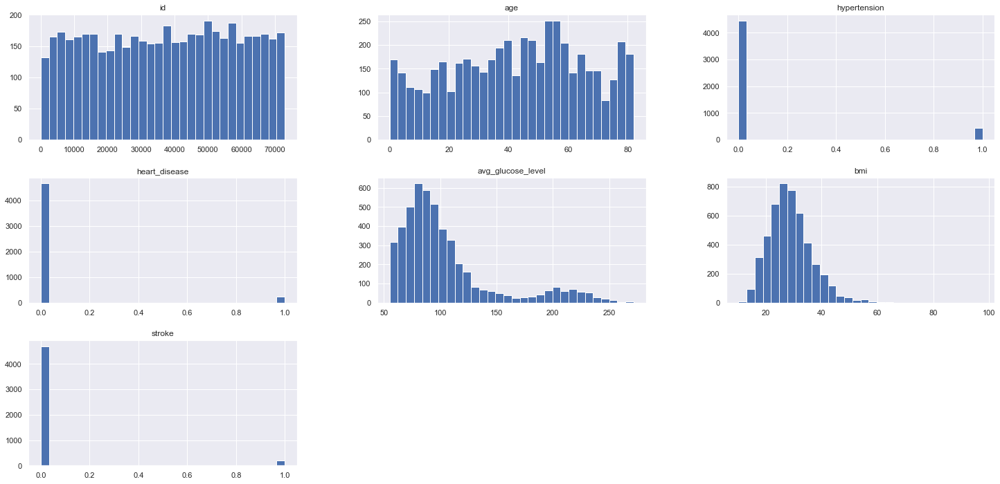

In [16]:
num_analysis(num_attributes)

## Categorical Attributes

In [23]:
pd.DataFrame(cat_attributes.apply(lambda x: x.unique())).T

,gender,ever_married,work_type,Residence_type,smoking_status
0,"[Male, Female, Other]","[Yes, No]","[Private, Self-employed, Govt_job, children, N...","[Urban, Rural]","[formerly smoked, never smoked, smokes, Unknown]"


In [24]:
cat_attributes.apply(lambda x: x.unique().shape)

,gender,ever_married,work_type,Residence_type,smoking_status
0,3,2,5,2,4


<AxesSubplot:xlabel='smoking_status', ylabel='stroke'>

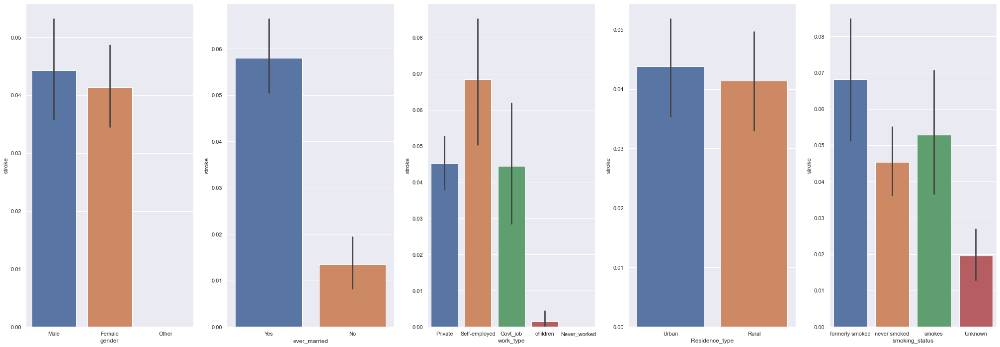

In [41]:
plt.subplot(1,5,1)
sns.barplot(x='gender',y='stroke',data=df1)

plt.subplot(1,5,2)
sns.barplot(x='ever_married',y='stroke',data=df1)

plt.subplot(1,5,3)
sns.barplot(x='work_type',y='stroke',data=df1)

plt.subplot(1,5,4)
sns.barplot(x='Residence_type',y='stroke',data=df1)

plt.subplot(1,5,5)
sns.barplot(x='smoking_status',y='stroke',data=df1)

There is considerable variation between the categories of the following variables: 'ever_married', 'work_type' and 'moking_status'. This makes these variables valuable for predictive performance, and special attention must be given in the encoding stage so they can influence the models learning process as well as they can.

# 2. Feature Engineering

In [444]:
df2 = df1.copy()

In [445]:
df2.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [446]:
# age x avg_glucose_level
df2['age_glucose'] = df2['age'] * df2['avg_glucose_level']
# age x bmi
df2['age_bmi'] = df2['age'] * df2['bmi']
# avg_glucose_level x bmi
df2['glucose_bmi'] = df2['bmi'] * df2['avg_glucose_level']

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,age_glucose,5.6264,20770.400,20764.7736,4832.239721,3959.64,3883.196664,1.501762,2.210596
1,age_bmi,1.1280,4040.400,4039.2720,1297.568617,NaN,766.721012,0.136248,-0.675355
2,glucose_bmi,701.0400,15133.512,14432.4720,3103.828934,NaN,1797.795029,2.036464,4.821139


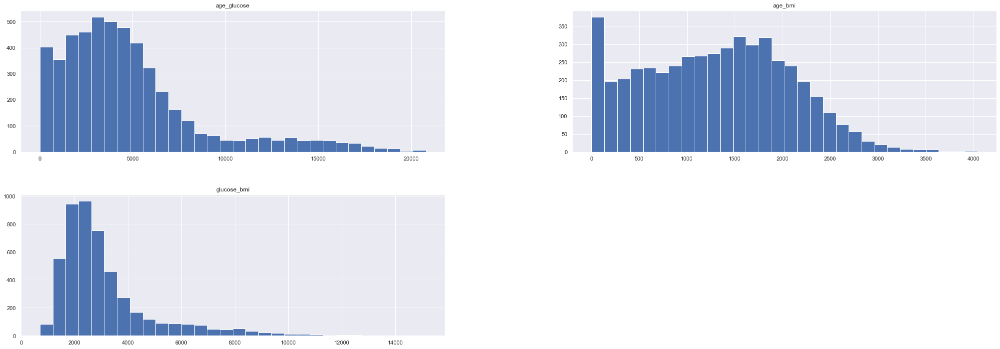

In [447]:
num_analysis(df2[['age_glucose','age_bmi','glucose_bmi']])

# 3. EDA

In [45]:
df3 = df2.copy()

In [438]:
df3.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_glucose,age_bmi,glucose_bmi
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,15322.23,2452.2,8370.054
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,8473.60,2600.0,3442.400
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,8390.27,1685.6,5890.312
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,13755.48,1896.0,4178.880
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,15083.01,2349.0,5400.090


## 3.1. Univariate

In [49]:
pr.ProfileReport(df3)

## 3.2. Bivariate

### Categorical x Response

<AxesSubplot:xlabel='smoking_status', ylabel='stroke'>

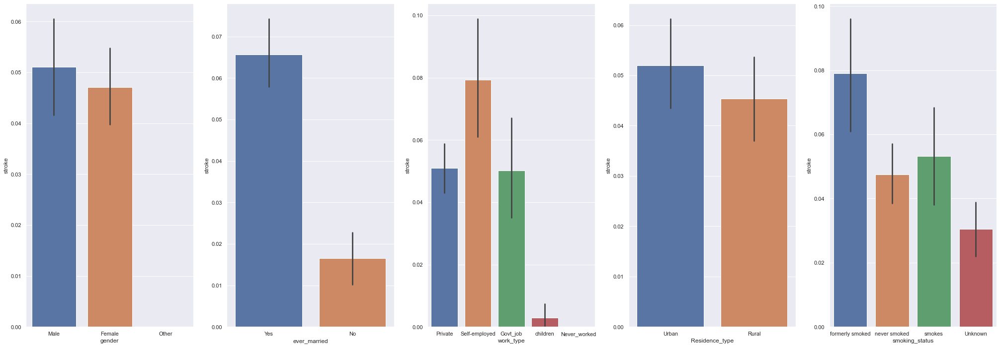

In [449]:
plt.subplot(1,5,1)
sns.barplot(x='gender',y='stroke',data=df1)

plt.subplot(1,5,2)
sns.barplot(x='ever_married',y='stroke',data=df1)

plt.subplot(1,5,3)
sns.barplot(x='work_type',y='stroke',data=df1)

plt.subplot(1,5,4)
sns.barplot(x='Residence_type',y='stroke',data=df1)

plt.subplot(1,5,5)
sns.barplot(x='smoking_status',y='stroke',data=df1)

In [378]:
df3['gender'].unique()

array(['Male', 'Female', 'Other'], dtype=object)

### Categorical x Numerical

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='age', ylabel='Density'>

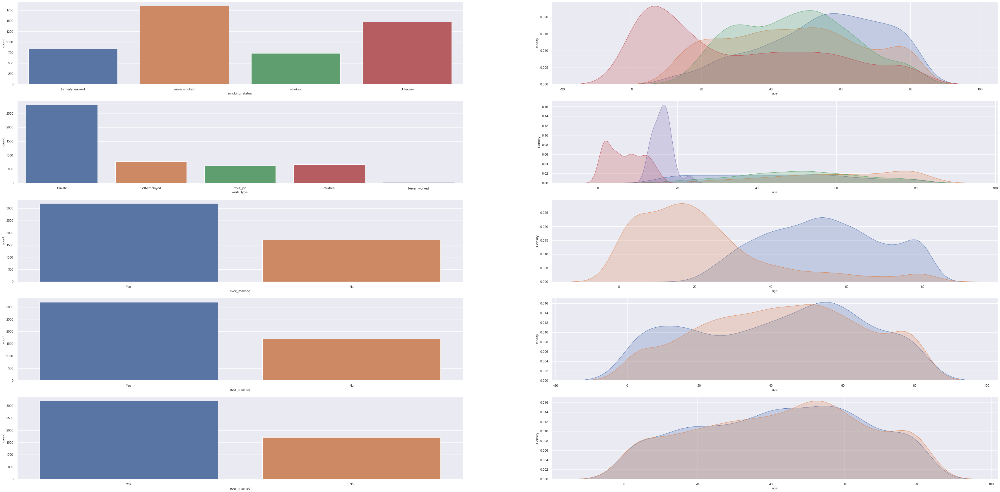

In [743]:
# smoking_statu x age

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['age'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['age'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['age'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['age'], label='unknown', shade=True)

# work_type x bmi
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['age'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['age'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['age'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['age'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['age'], label='Never_worked', shade=True)

# ever_married x bmi
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['age'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['age'], label='No', shade=True)

# ever_married x bmi
plt.subplot(5,2,7)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['age'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['age'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['age'], label='Other', shade=True)

# ever_married x bmi
plt.subplot(5,2,9)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['age'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['age'], label='Urban', shade=True)

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='bmi', ylabel='Density'>

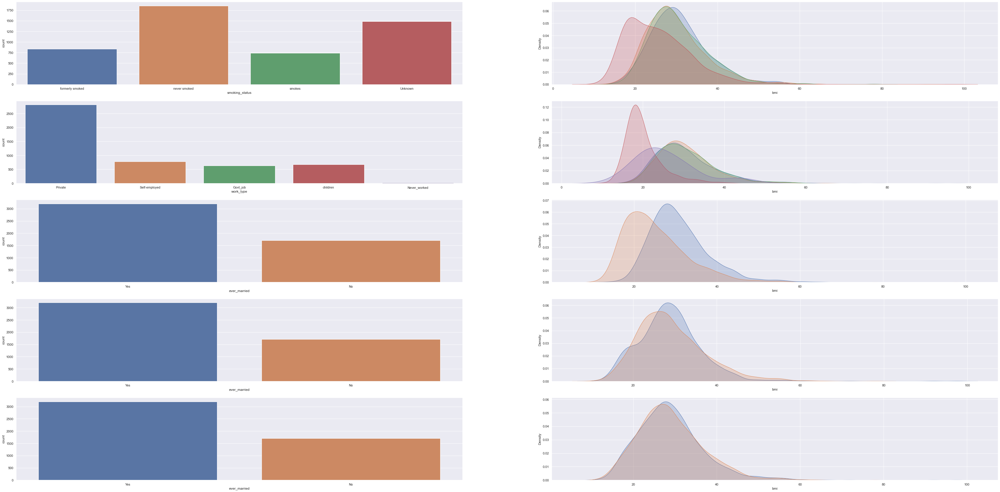

In [385]:
# smoking_statu x bmi

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['bmi'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['bmi'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['bmi'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['bmi'], label='unknown', shade=True)

# work_type x bmi
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['bmi'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['bmi'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['bmi'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['bmi'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['bmi'], label='Never_worked', shade=True)

# ever_married x bmi
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['bmi'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['bmi'], label='No', shade=True)

# ever_married x bmi
plt.subplot(5,2,7)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['bmi'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['bmi'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['bmi'], label='Other', shade=True)

# ever_married x bmi
plt.subplot(5,2,9)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['bmi'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['bmi'], label='Urban', shade=True)

c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\lucas\miniconda3\li

<AxesSubplot:xlabel='avg_glucose_level', ylabel='Density'>

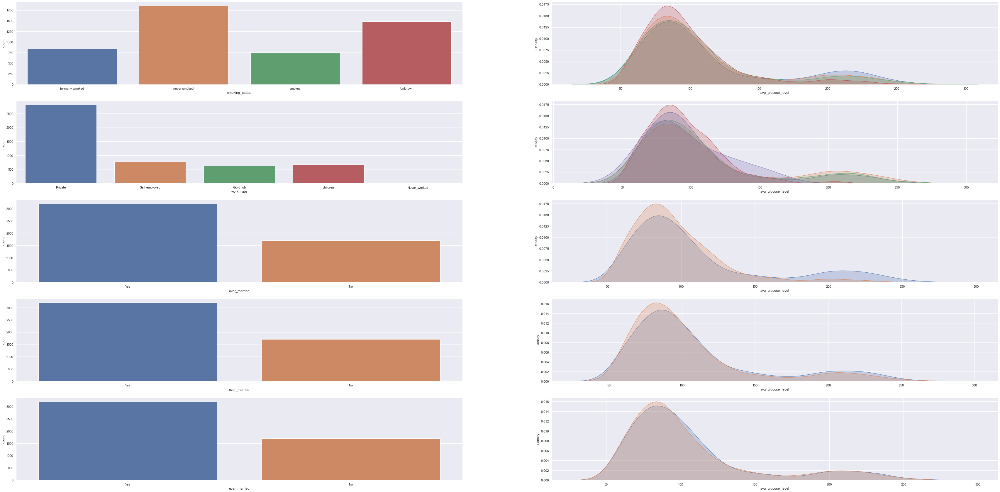

In [386]:
# smoking_statu x avg_glucose_level

plt.figure(figsize=(60,30))

plt.subplot(5,2,1)
sns.countplot(df3['smoking_status'])

plt.subplot(5,2,2)
sns.kdeplot(df3[df3['smoking_status'] == 'formerly smoked']['avg_glucose_level'], label='formerly smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'never smoked']['avg_glucose_level'], label='never smoked', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'smokes']['avg_glucose_level'], label='smokes', shade=True)
sns.kdeplot(df3[df3['smoking_status'] == 'Unknown']['avg_glucose_level'], label='unknown', shade=True)

# work_type x avg_glucose_level
plt.subplot(5,2,3)
sns.countplot(df3['work_type'])

plt.subplot(5,2,4)
sns.kdeplot(df3[df3['work_type'] == 'Private']['avg_glucose_level'], label='Private', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Self-employed']['avg_glucose_level'], label='Self-employed', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Govt_job']['avg_glucose_level'], label='Govt_job', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'children']['avg_glucose_level'], label='children', shade=True)
sns.kdeplot(df3[df3['work_type'] == 'Never_worked']['avg_glucose_level'], label='Never_worked', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,5)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,6)
sns.kdeplot(df3[df3['ever_married'] == 'Yes']['avg_glucose_level'], label='Yes', shade=True)
sns.kdeplot(df3[df3['ever_married'] == 'No']['avg_glucose_level'], label='No', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,7)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,8)
sns.kdeplot(df3[df3['gender'] == 'Male']['avg_glucose_level'], label='Male', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Female']['avg_glucose_level'], label='Female', shade=True)
sns.kdeplot(df3[df3['gender'] == 'Other']['avg_glucose_level'], label='Other', shade=True)

# ever_married x avg_glucose_level
plt.subplot(5,2,9)
sns.countplot(df3['ever_married'])

plt.subplot(5,2,10)
sns.kdeplot(df3[df3['Residence_type'] == 'Rural']['avg_glucose_level'], label='Rural', shade=True)
sns.kdeplot(df3[df3['Residence_type'] == 'Urban']['avg_glucose_level'], label='Urban', shade=True)

# gender	ever_married	work_type	Residence_type	smoking_status

The numerical feature 'avg_glucose_level' doesn´t seem to vary much, as a function of categorical variables in the dataset. However a significant difference is seen in the higher values of glucose in people who are positive for 'ever_married', as well as for those who are in 'gov_jobs' and 'self_enployed' for the 'work_type' variable.

### Numerical x Numerical

<AxesSubplot:xlabel='bmi', ylabel='avg_glucose_level'>

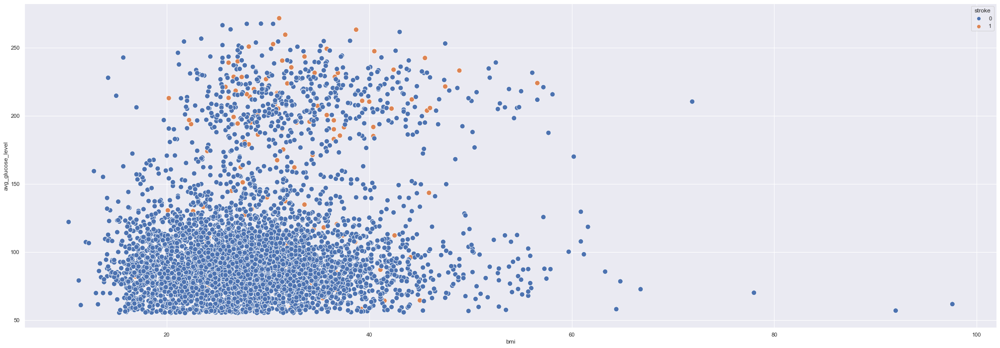

In [436]:
sns.scatterplot(x='bmi', y='avg_glucose_level', data=df3, hue='stroke', s=100)

The above scatter plot shows how stroke incidents tend to accumulate in higher values of the feature 'avg_glucose_level' but also, to a smaller extent, to higher values in the 'bmi' feature.

<AxesSubplot:xlabel='age', ylabel='avg_glucose_level'>

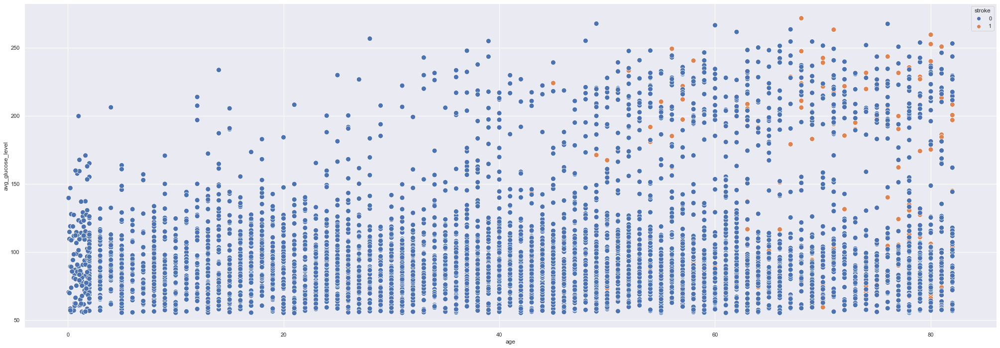

In [551]:
sns.scatterplot(x='age', y='avg_glucose_level', data=df3, hue='stroke', s=100)

<AxesSubplot:xlabel='age', ylabel='bmi'>

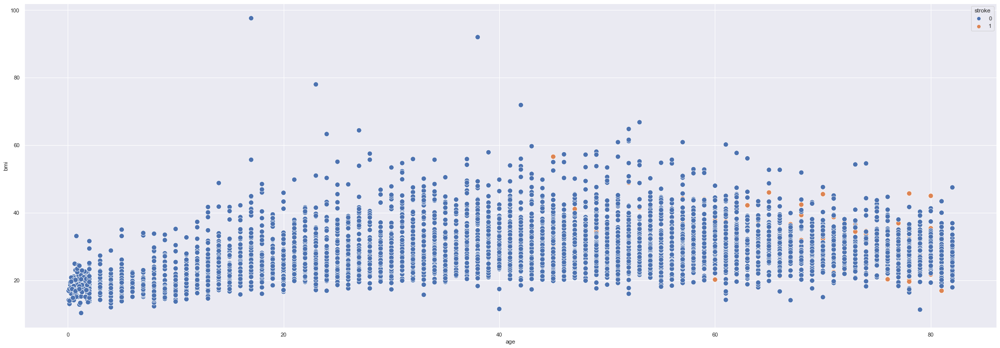

In [552]:
sns.scatterplot(x='age', y='bmi', data=df3, hue='stroke', s=100)

In [564]:
viz_num = df3.copy()
mms = MinMaxScaler()

viz_num['age'] = mms.fit_transform(df3['age'].values.reshape(-1,1))
viz_num['avg_glucose_level'] = mms.fit_transform(df3['avg_glucose_level'].values.reshape(-1,1))
viz_num['bmi'] = mms.fit_transform(df3['bmi'].values.reshape(-1,1))

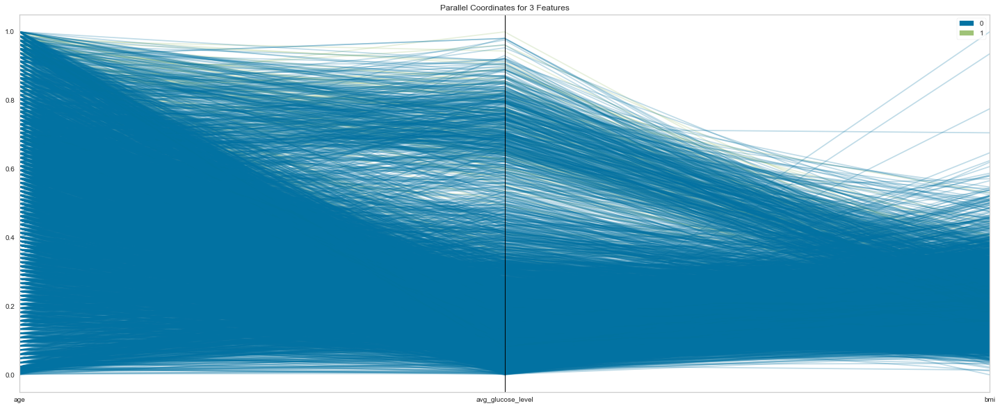

<AxesSubplot:title={'center':'Parallel Coordinates for 3 Features'}>

In [568]:
x = viz_num[['age','avg_glucose_level','bmi']]
y = viz_num['stroke']

plt.rcParams['figure.figsize'] = (25, 10)
viz = ParallelCoordinates()
viz.fit(x,y)
viz.transform(x)
viz.show()

### Numerical x Response

## 3.3. Multivariate

In [71]:
num_attributes = df3.select_dtypes(include=['int64', 'float64'])
cat_attributes = df3.select_dtypes(exclude=['int64', 'float64'])

### Numerical Variables

<AxesSubplot:>

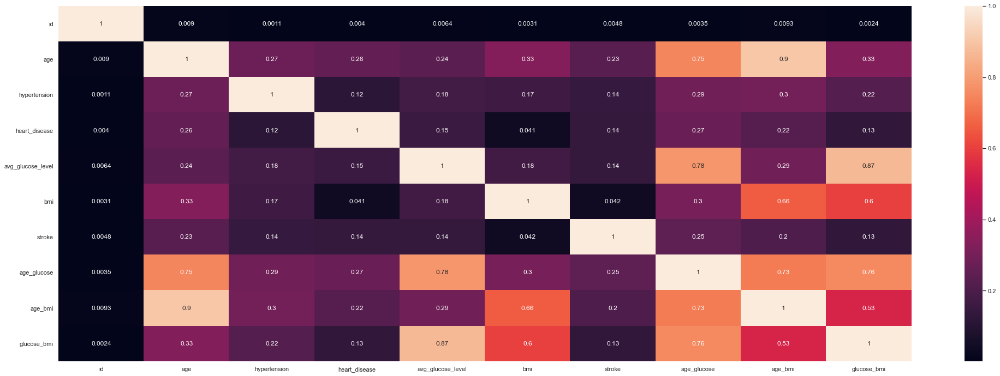

In [74]:
corr = num_attributes.corr(method='pearson')
sns.heatmap(corr, annot=True)

### Categorical Variables - Cramer´s V

In [77]:
a1 = cramer_v(cat_attributes['gender'], cat_attributes['gender'])
a2 = cramer_v(cat_attributes['gender'], cat_attributes['ever_married'])
a3 = cramer_v(cat_attributes['gender'], cat_attributes['work_type'])
a4 = cramer_v(cat_attributes['gender'], cat_attributes['Residence_type'])
a5 = cramer_v(cat_attributes['gender'], cat_attributes['smoking_status'])

a6 = cramer_v(cat_attributes['ever_married'], cat_attributes['gender'])
a7 = cramer_v(cat_attributes['ever_married'], cat_attributes['ever_married'])
a8 = cramer_v(cat_attributes['ever_married'], cat_attributes['work_type'])
a9 = cramer_v(cat_attributes['ever_married'], cat_attributes['Residence_type'])
a10 = cramer_v(cat_attributes['ever_married'], cat_attributes['smoking_status'])

a11 = cramer_v(cat_attributes['work_type'], cat_attributes['gender'])
a12 = cramer_v(cat_attributes['work_type'], cat_attributes['ever_married'])
a13 = cramer_v(cat_attributes['work_type'], cat_attributes['work_type'])
a14 = cramer_v(cat_attributes['work_type'], cat_attributes['Residence_type'])
a15 = cramer_v(cat_attributes['work_type'], cat_attributes['smoking_status'])

a16 = cramer_v(cat_attributes['Residence_type'], cat_attributes['gender'])
a17 = cramer_v(cat_attributes['Residence_type'], cat_attributes['ever_married'])
a18 = cramer_v(cat_attributes['Residence_type'], cat_attributes['work_type'])
a19 = cramer_v(cat_attributes['Residence_type'], cat_attributes['Residence_type'])
a20 = cramer_v(cat_attributes['Residence_type'], cat_attributes['smoking_status'])

a21 = cramer_v(cat_attributes['smoking_status'], cat_attributes['gender'])
a22 = cramer_v(cat_attributes['smoking_status'], cat_attributes['ever_married'])
a23 = cramer_v(cat_attributes['smoking_status'], cat_attributes['work_type'])
a24 = cramer_v(cat_attributes['smoking_status'], cat_attributes['Residence_type'])
a25 = cramer_v(cat_attributes['smoking_status'], cat_attributes['smoking_status'])

In [78]:
d = pd.DataFrame({'gender': [a1, a2, a3, a4, a5],
                  'ever_marries' :[a6, a7, a8, a9, a10],
                  'work_type' :[a11, a12, a13, a14, a15],
                  'Residence_type' :[a16, a17, a18, a19, a20],
                  'smoking_status' :[a21, a22, a23, a24, a25]              
                 })
d = d.set_index(d.columns)

<AxesSubplot:>

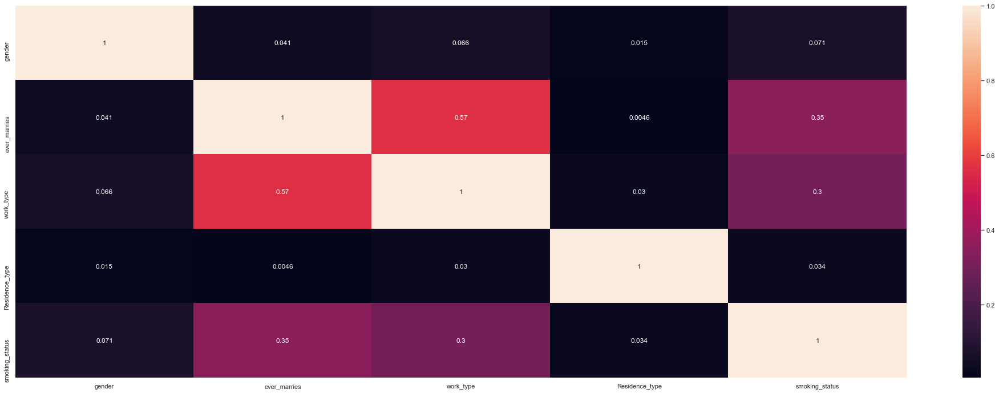

In [80]:
sns.heatmap(d, annot=True)

# 4. Data Preparation

In [459]:
df4 = df3.copy()

In [460]:
df4.drop(['id'], axis=1, inplace=True)

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,age,0.0800,82.000,81.9200,42.865374,44.000,22.552818,-0.119070,-0.988091
1,hypertension,0.0000,1.000,1.0000,0.091872,0.000,0.288845,2.826791,5.993192
2,heart_disease,0.0000,1.000,1.0000,0.049501,0.000,0.216911,4.155030,15.270496
3,avg_glucose_level,55.1200,271.740,216.6200,105.305150,91.680,44.419816,1.614026,1.905601
4,bmi,10.3000,97.600,87.3000,28.893237,28.100,7.853267,1.055340,3.362659
5,stroke,0.0000,1.000,1.0000,0.042575,0.000,0.201897,4.532666,18.552620
6,age_glucose,5.6264,20770.400,20764.7736,4750.205383,3907.920,3823.473172,1.539615,2.421373
7,age_bmi,1.1280,4040.400,4039.2720,1297.568617,1324.300,766.721012,0.136248,-0.675355
8,glucose_bmi,701.0400,15133.512,14432.4720,3103.828934,2580.396,1797.795029,2.036464,4.821139


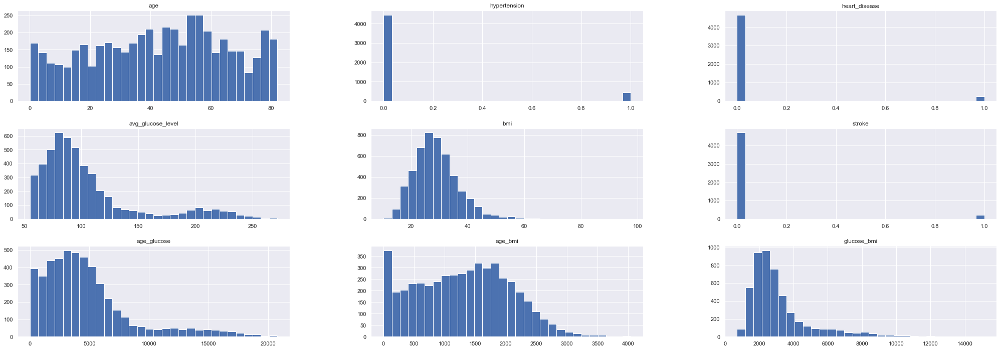

In [461]:
num_analysis(df4.select_dtypes(include=['int64', 'float64']))

### Normalization

In [462]:
df4['bmi'].unique()

array([36.6, 32.5, 34.4, 24. , 29. , 27.4, 22.8, 24.2, 29.7, 36.8, 27.3,
       28.2, 30.9, 37.5, 25.8, 37.8, 22.4, 48.9, 26.6, 27.2, 23.5, 28.3,
       44.2, 25.4, 22.2, 30.5, 26.5, 33.7, 23.1, 32. , 29.9, 23.9, 28.5,
       26.4, 20.2, 33.6, 38.6, 39.2, 27.7, 31.4, 36.5, 33.2, 32.8, 40.4,
       25.3, 30.2, 47.5, 20.3, 30. , 28.9, 28.1, 31.1, 21.7, 27. , 24.1,
       45.9, 44.1, 22.9, 29.1, 32.3, 41.1, 25.6, 29.8, 26.3, 26.2, 29.4,
       24.4, 28. , 28.8, 34.6, 19.4, 30.3, 41.5, 22.6, 56.6, 27.1, 31.3,
       31. , 31.7, 35.8, 28.4, 20.1, 26.7, 38.7, 34.9, 25. , 23.8, 21.8,
       27.5, 24.6, 32.9, 26.1, 31.9, 34.1, 36.9, 37.3, 45.7, 34.2, 23.6,
       22.3, 37.1, 45. , 25.5, 30.8, 37.4, 34.5, 27.9, 29.5, 46. , 42.5,
       35.5, 26.9, 45.5, 31.5, 33. , 23.4, 30.7, 20.5, 21.5, 40. , 28.6,
       42.2, 29.6, 35.4, 16.9, 26.8, 39.3, 32.6, 35.9, 21.2, 42.4, 40.5,
       36.7, 29.3, 19.6, 18. , 17.6, 19.1, 50.1, 17.7, 54.6, 35. , 22. ,
       39.4, 19.7, 22.5, 25.2, 41.8, 60.9, 23.7, 24

In [463]:
ss = StandardScaler()

# the 'normalizer' is used on features that show a gaussian or normal distribution

In [ ]:
ss.fit_transform()

In [464]:
df4['bmi'].values

array([36.6, 32.5, 34.4, ..., 30.6, 25.6, 26.2])

In [466]:
ss.fit_transform(df4['bmi'].values.reshape(-1,1))

array([[ 0.98134488],
       [ 0.45926914],
       [ 0.70120668],
       ...,
       [ 0.21733161],
       [-0.41934612],
       [-0.34294479]])

In [467]:
df4['bmi'] = ss.fit_transform(df4['bmi'].values.reshape(-1,1))
df4['glucose_bmi'] = ss.fit_transform(df4['glucose_bmi'].values.reshape(-1,1))

In [468]:
df4['bmi'].unique()

array([ 9.81344880e-01,  4.59269144e-01,  7.01206680e-01, -6.23082990e-01,
        1.35947360e-02, -1.90142136e-01, -7.75885644e-01, -5.97615881e-01,
        1.02729618e-01,  1.00681199e+00, -2.02875691e-01, -8.82737001e-02,
        2.55532272e-01,  1.09594687e+00, -3.93879009e-01,  1.13414753e+00,
       -8.26819862e-01,  2.54757209e+00, -2.92010573e-01, -2.15609245e-01,
       -6.86750763e-01, -7.55401456e-02,  1.94909502e+00, -4.44813227e-01,
       -8.52286972e-01,  2.04598054e-01, -3.04744127e-01,  6.12071799e-01,
       -7.37684981e-01,  3.95601372e-01,  1.28196727e-01, -6.35816545e-01,
       -5.00730366e-02, -3.17477682e-01, -1.10695806e+00,  5.99338244e-01,
        1.23601597e+00,  1.31241730e+00, -1.51941473e-01,  3.19200045e-01,
        9.68611325e-01,  5.48404026e-01,  4.97469808e-01,  1.46521995e+00,
       -4.57546781e-01,  1.66397390e-01,  2.36930232e+00, -1.09422451e+00,
        1.40930281e-01,  8.61181524e-04, -1.01007255e-01,  2.80999381e-01,
       -9.15954744e-01, -

c:\users\lucas\miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='bmi', ylabel='Density'>

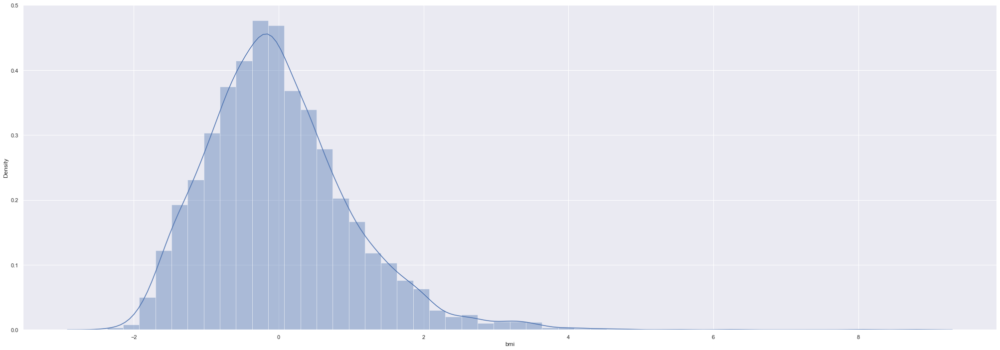

In [469]:
sns.distplot(df4['bmi'])

### Rescaling (MinMax, Robust Scaler)

In [470]:
rs = RobustScaler() 
mms = MinMaxScaler()

c:\users\lucas\miniconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='age', ylabel='Density'>

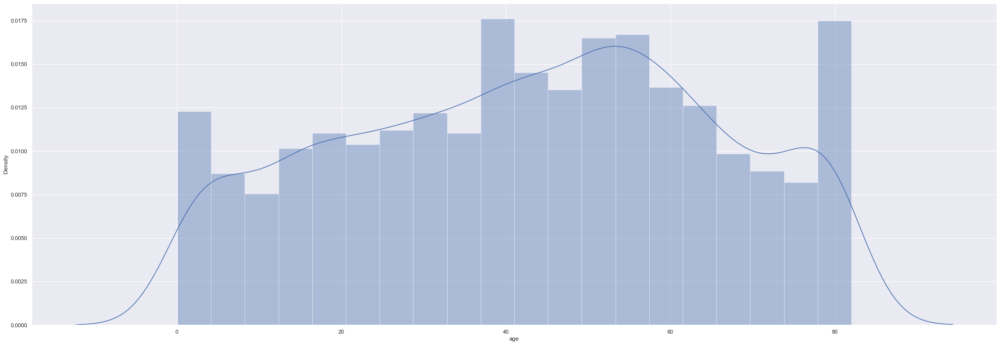

In [475]:
sns.distplot(df4['age'])

In [477]:
df4['age'] = mms.fit_transform(df4['age'].values.reshape(-1,1))
df4['avg_glucose_level'] = rs.fit_transform(df4['avg_glucose_level'].values.reshape(-1,1))
df4['age_glucose'] = rs.fit_transform(df4['age_glucose'].values.reshape(-1,1))
df4['age_bmi'] = mms.fit_transform(df4['age_bmi'].values.reshape(-1,1))

### Transformation 
  - Encoding Categorical Variables
        One Hot Enconding (Dummie)
        Label Encoding
        Ordinal Encoding
        Target Encoding
        Frequency Encoding
        Embedding Encoding

In [478]:
df4.select_dtypes(exclude=['int64', 'float64'])

,gender,ever_married,work_type,Residence_type,smoking_status
0,Male,Yes,Private,Urban,formerly smoked
2,Male,Yes,Private,Rural,never smoked
3,Female,Yes,Private,Urban,smokes
4,Female,Yes,Self-employed,Rural,never smoked
5,Male,Yes,Private,Urban,formerly smoked
...,...,...,...,...,...
5104,Female,No,children,Rural,Unknown
5106,Female,Yes,Self-employed,Urban,never smoked
5107,Female,Yes,Self-employed,Rural,never smoked
5108,Male,Yes,Private,Rural,formerly smoked


In [479]:
df4.select_dtypes(exclude=['int64', 'float64']).apply(lambda x: x.unique().shape)

,gender,ever_married,work_type,Residence_type,smoking_status
0,3,2,5,2,4


In [480]:
pd.get_dummies(df4['work_type'], prefix='work', columns=['work_type'])

,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children
0,0,0,1,0,0
2,0,0,1,0,0
3,0,0,1,0,0
4,0,0,0,1,0
5,0,0,1,0,0
...,...,...,...,...,...
5104,0,0,0,0,1
5106,0,0,0,1,0
5107,0,0,0,1,0
5108,0,0,1,0,0


In [481]:
le = LabelEncoder()

In [482]:
df4['gender'] = le.fit_transform(df4['gender'])
df4['ever_married'] = le.fit_transform(df4['ever_married'])
df4['Residence_type'] = le.fit_transform(df4['Residence_type'])

In [483]:
assortment_dict = {'Unknown': 0, 'never smoked': 1, 'smokes': 2, 'formerly smoked': 3}
df4['smoking_status'] = df4['smoking_status'].map(assortment_dict)

In [484]:
df4 = pd.get_dummies(df4, prefix=['work'], columns=['work_type'])

In [485]:
df4.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'Residence_type', 'avg_glucose_level', 'bmi', 'smoking_status',
       'stroke', 'age_glucose', 'age_bmi', 'glucose_bmi', 'work_Govt_job',
       'work_Never_worked', 'work_Private', 'work_Self-employed',
       'work_children'],
      dtype='object')

In [531]:
df4 = df4[['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'Residence_type', 'avg_glucose_level', 'bmi', 'smoking_status',
       'age_glucose', 'age_bmi', 'glucose_bmi', 'work_Govt_job',
       'work_Never_worked', 'work_Private', 'work_Self-employed',
       'work_children', 'stroke']]

df4.head()

,gender,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,smoking_status,age_glucose,age_bmi,glucose_bmi,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children,stroke
0,1,0.816895,0,1,1,1,3.753699,0.981345,3,2.963209,0.606810,2.929269,0,0,1,0,0,1
2,1,0.975586,0,1,1,0,0.390137,0.459269,1,1.185272,0.643401,0.188326,0,0,1,0,0,1
3,0,0.597168,0,0,1,1,2.179452,0.701207,2,1.163639,0.417024,1.549945,0,0,1,0,0,1
4,0,0.963379,1,0,1,0,2.258630,-0.623083,1,2.556473,0.469112,0.597983,0,0,0,1,0,1
5,1,0.987793,0,0,1,1,2.589863,0.013595,3,2.901106,0.581261,1.277265,0,0,1,0,0,1


# 5. Balancing Response Variable

In [487]:
# check balanced data
df4['stroke'].value_counts()

0    4700
1     209
Name: stroke, dtype: int64

In [488]:
# ratio balanced
ratio = {0: 4700,
         1: 4700}

# define sampler
smt = c.SMOTETomek(sampling_strategy=ratio, random_state=32, n_jobs=-1)

# apply sampler
X_smt, y_smt = smt.fit_resample(df4.drop('stroke', axis=1), df4['stroke'])

# 6. Feature Selection

In [489]:
# train-test split
x_train, x_test, y_train, y_test = ms.train_test_split(X_smt, y_smt, test_size=0.2)

# reuniting train
df5 = pd.concat([x_train, y_train], axis=1)
df5

,gender,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,smoking_status,age_glucose,age_bmi,glucose_bmi,work_Govt_job,work_Never_worked,work_Private,work_Self-employed,work_children,stroke
2661,1,0.008789,0,0,0,1,-0.450959,0.535670,0,-0.998893,0.006276,-0.341556,0,0,0,0,1,0
2416,1,0.670410,0,0,1,1,-0.198356,0.204598,3,0.191142,0.415018,-0.293921,0,0,1,0,0,0
9301,0,0.826331,0,0,0,1,-0.274904,-0.216058,0,0.422426,0.455947,-0.491754,1,0,0,0,0,1
8545,0,0.979938,0,0,0,1,-0.341421,-0.537262,2,0.634910,0.490958,-0.651005,1,0,0,0,0,1
8854,0,0.923460,0,0,1,0,3.791019,0.636154,0,3.519463,0.632046,2.593319,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1487,0,0.401855,0,0,0,1,-0.365479,-0.432080,1,-0.343379,0.208050,-0.615286,0,0,1,0,0,0
5315,0,0.959752,0,0,1,0,-0.078380,-0.771647,0,0.800978,0.444852,-0.590788,0,0,1,0,0,1
8560,1,0.714844,0,0,1,0,0.067507,1.766752,0,0.419519,0.621145,0.519946,0,0,1,0,0,1
3409,1,0.462891,0,0,1,1,0.014795,1.516154,1,-0.104766,0.383552,0.366419,0,0,1,0,0,0


## Boruta

In [490]:
# boruta algorithm
x_train_n = df5.drop(['stroke'], axis=1).values
y_train_n = y_train.values

# define model 
et = en.ExtraTreesClassifier(n_jobs=-1)

# Define Boruta
boruta = bt.BorutaPy(et, n_estimators='auto', verbose=2, random_state=42).fit(x_train_n, y_train_n)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	17
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	9 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	10 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	11 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	12 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	13 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	14 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	15 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration: 	16 / 100
Confirmed: 	9
Tentative: 	2
Rejected: 	6
Iteration:

In [543]:
cols_selected = boruta.support_.tolist()

# best features according to boruta
cols_sel_boruta = x_train_n.iloc[:, cols_selected].columns.tolist()
cols_sel_boruta

['gender',
 'age',
 'ever_married',
 'avg_glucose_level',
 'bmi',
 'smoking_status',
 'age_glucose',
 'age_bmi',
 'glucose_bmi']

In [537]:
# np.setdiff1d - Find the set difference of two arrays. Return the unique values in ar1 that are not in ar2.
cols_not_selected_boruta = list(np.setdiff1d(x_train_n.columns, cols_sel_boruta))
cols_not_selected_boruta

['Residence_type',
 'heart_disease',
 'hypertension',
 'work_Govt_job',
 'work_Never_worked',
 'work_Private',
 'work_Self-employed',
 'work_children']

## Feature Importance

In [492]:
# feature importance
forest = en.ExtraTreesClassifier(n_estimators=250, random_state=0, n_jobs=-1)

# data preparation
x_train_n = df5.drop(['stroke'], axis=1)
y_train_n = y_train.values
forest.fit(x_train_n, y_train_n)

ExtraTreesClassifier(n_estimators=250, n_jobs=-1, random_state=0)

In [493]:
# plotting importance results
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# print the feature ranking
print('Feature ranking:')
df = pd.DataFrame()
for i, j in zip(x_train_n, forest.feature_importances_):
    aux = pd.DataFrame({'feature': i, 'importance': j}, index=[0])
    df= pd.concat([df, aux], axis=0)
    
print(df.sort_values('importance', ascending=False))

Feature ranking:
              feature  importance
0                 age    0.231255
0             age_bmi    0.132963
0         age_glucose    0.130038
0   avg_glucose_level    0.088092
0         glucose_bmi    0.075416
0                 bmi    0.073151
0      smoking_status    0.063455
0        ever_married    0.029450
0              gender    0.027833
0      Residence_type    0.027672
0  work_Self-employed    0.024536
0        work_Private    0.023194
0       work_Govt_job    0.022445
0        hypertension    0.019279
0       work_children    0.017339
0       heart_disease    0.013510
0   work_Never_worked    0.000371


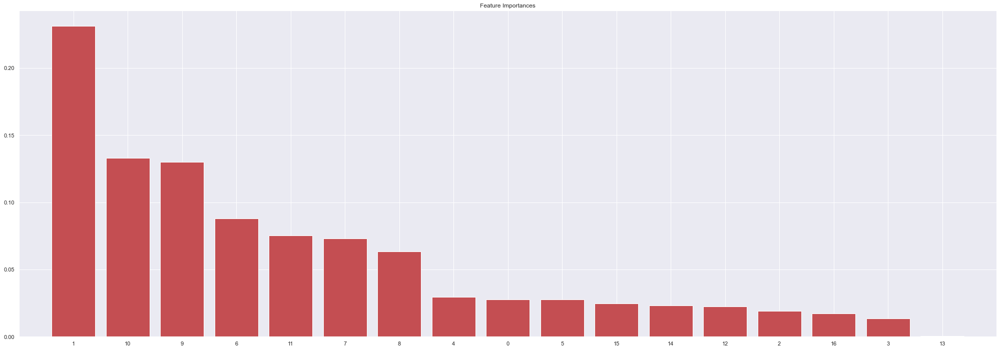

In [494]:
# plot the impurity-base feature importance of the forest
plt.figure()
plt.title('Feature Importances')
plt.bar(range(x_train_n.shape[1]), importances[indices], color='r', align='center')
plt.xticks(range(x_train_n.shape[1]), indices)
plt.xlim([-1, x_train_n.shape[1]])
plt.show()

In [ ]:
# boruta: ['gender', 'age', 'ever_married', 'avg_glucose_level', 'bmi', 'smoking_status', 'age_glucose', 'age_bmi', 'glucose_bmi']

# importance:  ['age',   'age_bmi',  'age_glucose', 'avg_glucose_level' ,   'glucose_bmi',    'bmi',    'smoking_status' ]  

# 6. ML Models

In [504]:
cols_selected = ['gender', 'age', 'ever_married', 'avg_glucose_level', 'bmi', 'smoking_status', 'age_glucose', 'age_bmi', 'glucose_bmi']
x_train = x_train[cols_selected]
x_test = x_test[cols_selected]

## 6.1. Logistic Regression

In [513]:
## Logistic Regression
# model definition
lr_model = lm.LogisticRegression(random_state=42)

# model training
lr_model.fit(x_train, y_train)

# predict
y_hat = lr_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))

print(m.classification_report(y_test, y_hat))

[[717 246]
 [173 739]]
              precision    recall  f1-score   support

           0       0.81      0.74      0.77       963
           1       0.75      0.81      0.78       912

    accuracy                           0.78      1875
   macro avg       0.78      0.78      0.78      1875
weighted avg       0.78      0.78      0.78      1875



In [731]:
lg_cv = cross_validation_classification(df5, "Logistic Regression", lm.LogisticRegression(random_state=42))
lg_cv

c:\users\lucas\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\lucas\miniconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Logistic Regression,0.798+-0.011,0.798+-0.011,0.821+-0.016,0.787+-0.018,0.803+-0.011


## 6.2. KNN

In [524]:
error_rate = []

# iterate over increasing n_neighbors:
for i in range(1,40):
    
    knn = nh.KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train, y_train)
    pred_i = knn.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

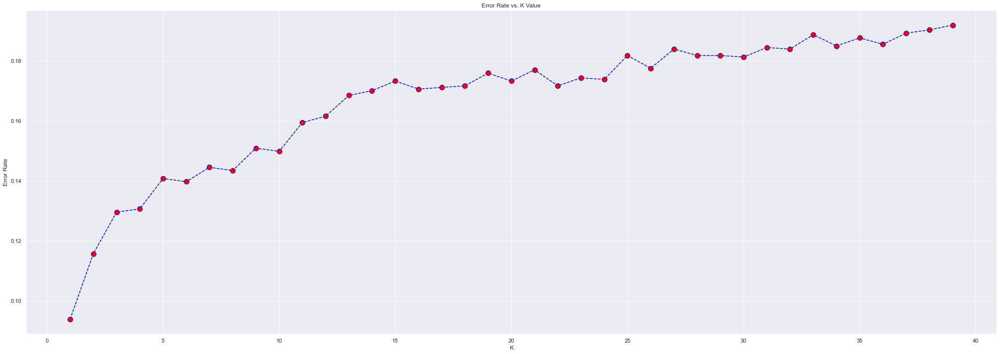

In [525]:
plt.plot(range(1,40), error_rate, color='blue', linestyle='dashed', marker='o', 
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [640]:
# KNN -----> n_neighbors = 1
# model definition
knn_model = nh.KNeighborsClassifier(n_neighbors=1)

# model training
knn_model.fit(x_train, y_train)

# predict
y_hat = knn_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[837 126]
 [ 50 862]]
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       963
           1       0.87      0.95      0.91       912

    accuracy                           0.91      1875
   macro avg       0.91      0.91      0.91      1875
weighted avg       0.91      0.91      0.91      1875



In [733]:
knn_cv = cross_validation_classification(df5, "KNN", nh.KNeighborsClassifier(n_neighbors=1))
knn_cv

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,KNN,0.922+-0.011,0.922+-0.011,0.974+-0.008,0.883+-0.016,0.926+-0.009


## 6.3. SVM

In [516]:
# SVM
# model definition
svm_model = svm.LinearSVC()

# model training
svm_model.fit(x_train, y_train)

# predict
y_hat = svm_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[707 256]
 [163 749]]
              precision    recall  f1-score   support

           0       0.81      0.73      0.77       963
           1       0.75      0.82      0.78       912

    accuracy                           0.78      1875
   macro avg       0.78      0.78      0.78      1875
weighted avg       0.78      0.78      0.78      1875



c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [734]:
svm_cv = cross_validation_classification(df5, "SVM", svm.LinearSVC())
svm_cv

c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\lucas\miniconda3\lib\site-packages\sklearn\svm\_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of itera

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,SVM,0.796+-0.011,0.796+-0.011,0.826+-0.015,0.782+-0.016,0.803+-0.01


## 6.4. Decision Tree Classifier

In [517]:
# Decision Tree Classifier
# model definition
dt_model = tree.DecisionTreeClassifier()

# model training
dt_model.fit(x_train, y_train)

# predict
y_hat = dt_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[843 120]
 [106 806]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.88       963
           1       0.87      0.88      0.88       912

    accuracy                           0.88      1875
   macro avg       0.88      0.88      0.88      1875
weighted avg       0.88      0.88      0.88      1875



In [735]:
dt_cv = cross_validation_classification(df5, "Decision Tree", tree.DecisionTreeClassifier())
dt_cv

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Decision Tree,0.893+-0.007,0.893+-0.007,0.906+-0.008,0.884+-0.011,0.895+-0.007


## 6.5. Random Forest Classifier

In [550]:
# Ensemble Methods - Random Forest
# model definition
rf_model = en.RandomForestClassifier()

# model training
rf_model.fit(x_train, y_train)

# predict
y_hat = rf_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

[[829 134]
 [ 42 870]]
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       963
           1       0.87      0.95      0.91       912

    accuracy                           0.91      1875
   macro avg       0.91      0.91      0.91      1875
weighted avg       0.91      0.91      0.91      1875



In [736]:
rf_cv = cross_validation_classification(df5, "Random Forest Classifier",en.RandomForestClassifier())
rf_cv

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Random Forest Classifier,0.926+-0.007,0.926+-0.007,0.96+-0.011,0.901+-0.009,0.929+-0.006


## 6.6. XGBoost Classifier

In [730]:
# Gradient boosting - XGBoost
# model definition
xgb_model = XGBClassifier()

# model training
xgb_model.fit(x_train, y_train)

# predict
y_hat = xgb_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[928  35]
 [ 40 872]]
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       963
           1       0.96      0.96      0.96       912

    accuracy                           0.96      1875
   macro avg       0.96      0.96      0.96      1875
weighted avg       0.96      0.96      0.96      1875



In [737]:
xgb_cv = cross_validation_classification(df5, "XGBoost Classifier", XGBClassifier())
xgb_cv

c:\users\lucas\miniconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:20:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:20:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:20:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:20:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,XGBoost Classifier,0.959+-0.004,0.959+-0.004,0.965+-0.005,0.954+-0.007,0.96+-0.004


## 6.7. CatBoost Classifier

In [571]:
# Gradient boosting - CatBoost
# model definition
cat_model = CatBoostClassifier()

# model training
cat_model.fit(x_train, y_train)

# predict
y_hat = cat_model.predict(x_test)

print(m.confusion_matrix(y_test, y_hat))
print(m.classification_report(y_test, y_hat))

Learning rate set to 0.024351
0:	learn: 0.6789556	total: 17.1ms	remaining: 17.1s
1:	learn: 0.6645739	total: 32.3ms	remaining: 16.1s
2:	learn: 0.6506717	total: 55.6ms	remaining: 18.5s
3:	learn: 0.6382156	total: 71.6ms	remaining: 17.8s
4:	learn: 0.6259004	total: 88.2ms	remaining: 17.6s
5:	learn: 0.6141414	total: 104ms	remaining: 17.2s
6:	learn: 0.6039341	total: 120ms	remaining: 17s
7:	learn: 0.5939238	total: 134ms	remaining: 16.6s
8:	learn: 0.5838142	total: 150ms	remaining: 16.5s
9:	learn: 0.5753155	total: 175ms	remaining: 17.3s
10:	learn: 0.5682432	total: 192ms	remaining: 17.2s
11:	learn: 0.5591505	total: 210ms	remaining: 17.3s
12:	learn: 0.5514233	total: 224ms	remaining: 17s
13:	learn: 0.5454188	total: 240ms	remaining: 16.9s
14:	learn: 0.5371726	total: 252ms	remaining: 16.6s
15:	learn: 0.5308412	total: 270ms	remaining: 16.6s
16:	learn: 0.5245959	total: 285ms	remaining: 16.5s
17:	learn: 0.5190006	total: 298ms	remaining: 16.3s
18:	learn: 0.5135151	total: 320ms	remaining: 16.5s
19:	learn:

165:	learn: 0.3421251	total: 3.99s	remaining: 20s
166:	learn: 0.3415357	total: 4.01s	remaining: 20s
167:	learn: 0.3411977	total: 4.03s	remaining: 19.9s
168:	learn: 0.3406906	total: 4.05s	remaining: 19.9s
169:	learn: 0.3402747	total: 4.06s	remaining: 19.8s
170:	learn: 0.3399388	total: 4.09s	remaining: 19.8s
171:	learn: 0.3393436	total: 4.11s	remaining: 19.8s
172:	learn: 0.3391275	total: 4.13s	remaining: 19.8s
173:	learn: 0.3388253	total: 4.15s	remaining: 19.7s
174:	learn: 0.3383034	total: 4.17s	remaining: 19.6s
175:	learn: 0.3379887	total: 4.18s	remaining: 19.6s
176:	learn: 0.3377156	total: 4.2s	remaining: 19.5s
177:	learn: 0.3371909	total: 4.22s	remaining: 19.5s
178:	learn: 0.3366740	total: 4.23s	remaining: 19.4s
179:	learn: 0.3363480	total: 4.25s	remaining: 19.4s
180:	learn: 0.3356809	total: 4.27s	remaining: 19.3s
181:	learn: 0.3353467	total: 4.28s	remaining: 19.2s
182:	learn: 0.3349324	total: 4.3s	remaining: 19.2s
183:	learn: 0.3344857	total: 4.31s	remaining: 19.1s
184:	learn: 0.3342

328:	learn: 0.2815293	total: 7.48s	remaining: 15.3s
329:	learn: 0.2813386	total: 7.5s	remaining: 15.2s
330:	learn: 0.2810322	total: 7.52s	remaining: 15.2s
331:	learn: 0.2807470	total: 7.54s	remaining: 15.2s
332:	learn: 0.2804959	total: 7.56s	remaining: 15.1s
333:	learn: 0.2803717	total: 7.58s	remaining: 15.1s
334:	learn: 0.2800762	total: 7.59s	remaining: 15.1s
335:	learn: 0.2798816	total: 7.61s	remaining: 15s
336:	learn: 0.2796221	total: 7.63s	remaining: 15s
337:	learn: 0.2794247	total: 7.64s	remaining: 15s
338:	learn: 0.2791731	total: 7.66s	remaining: 14.9s
339:	learn: 0.2789087	total: 7.68s	remaining: 14.9s
340:	learn: 0.2785729	total: 7.71s	remaining: 14.9s
341:	learn: 0.2783651	total: 7.72s	remaining: 14.9s
342:	learn: 0.2782189	total: 7.75s	remaining: 14.8s
343:	learn: 0.2779756	total: 7.76s	remaining: 14.8s
344:	learn: 0.2771100	total: 7.79s	remaining: 14.8s
345:	learn: 0.2767976	total: 7.81s	remaining: 14.8s
346:	learn: 0.2764449	total: 7.84s	remaining: 14.8s
347:	learn: 0.27621

490:	learn: 0.2260526	total: 11.2s	remaining: 11.6s
491:	learn: 0.2258792	total: 11.2s	remaining: 11.5s
492:	learn: 0.2252849	total: 11.2s	remaining: 11.5s
493:	learn: 0.2249572	total: 11.2s	remaining: 11.5s
494:	learn: 0.2247251	total: 11.2s	remaining: 11.4s
495:	learn: 0.2245231	total: 11.2s	remaining: 11.4s
496:	learn: 0.2238548	total: 11.2s	remaining: 11.4s
497:	learn: 0.2237345	total: 11.3s	remaining: 11.4s
498:	learn: 0.2229621	total: 11.3s	remaining: 11.3s
499:	learn: 0.2222790	total: 11.3s	remaining: 11.3s
500:	learn: 0.2220241	total: 11.3s	remaining: 11.3s
501:	learn: 0.2217416	total: 11.3s	remaining: 11.2s
502:	learn: 0.2214254	total: 11.3s	remaining: 11.2s
503:	learn: 0.2205344	total: 11.4s	remaining: 11.2s
504:	learn: 0.2197278	total: 11.4s	remaining: 11.1s
505:	learn: 0.2195156	total: 11.4s	remaining: 11.1s
506:	learn: 0.2189757	total: 11.4s	remaining: 11.1s
507:	learn: 0.2183867	total: 11.4s	remaining: 11.1s
508:	learn: 0.2180007	total: 11.4s	remaining: 11s
509:	learn: 0.

650:	learn: 0.1786954	total: 14.7s	remaining: 7.88s
651:	learn: 0.1785206	total: 14.7s	remaining: 7.86s
652:	learn: 0.1783789	total: 14.7s	remaining: 7.83s
653:	learn: 0.1782412	total: 14.8s	remaining: 7.81s
654:	learn: 0.1781094	total: 14.8s	remaining: 7.79s
655:	learn: 0.1779341	total: 14.8s	remaining: 7.76s
656:	learn: 0.1777748	total: 14.8s	remaining: 7.74s
657:	learn: 0.1774287	total: 14.8s	remaining: 7.72s
658:	learn: 0.1772600	total: 14.9s	remaining: 7.7s
659:	learn: 0.1770519	total: 14.9s	remaining: 7.67s
660:	learn: 0.1769475	total: 14.9s	remaining: 7.65s
661:	learn: 0.1768182	total: 15s	remaining: 7.63s
662:	learn: 0.1766811	total: 15s	remaining: 7.61s
663:	learn: 0.1764523	total: 15s	remaining: 7.59s
664:	learn: 0.1760694	total: 15s	remaining: 7.56s
665:	learn: 0.1759540	total: 15s	remaining: 7.54s
666:	learn: 0.1753839	total: 15.1s	remaining: 7.52s
667:	learn: 0.1752256	total: 15.1s	remaining: 7.5s
668:	learn: 0.1748421	total: 15.1s	remaining: 7.47s
669:	learn: 0.1746456	to

814:	learn: 0.1420136	total: 18.6s	remaining: 4.23s
815:	learn: 0.1418879	total: 18.6s	remaining: 4.2s
816:	learn: 0.1417610	total: 18.7s	remaining: 4.18s
817:	learn: 0.1416313	total: 18.7s	remaining: 4.16s
818:	learn: 0.1415688	total: 18.7s	remaining: 4.14s
819:	learn: 0.1415115	total: 18.7s	remaining: 4.11s
820:	learn: 0.1414360	total: 18.8s	remaining: 4.09s
821:	learn: 0.1412606	total: 18.8s	remaining: 4.07s
822:	learn: 0.1411933	total: 18.8s	remaining: 4.05s
823:	learn: 0.1410522	total: 18.8s	remaining: 4.03s
824:	learn: 0.1409237	total: 18.9s	remaining: 4s
825:	learn: 0.1407976	total: 18.9s	remaining: 3.98s
826:	learn: 0.1407409	total: 18.9s	remaining: 3.96s
827:	learn: 0.1406725	total: 18.9s	remaining: 3.94s
828:	learn: 0.1405424	total: 19s	remaining: 3.91s
829:	learn: 0.1404731	total: 19s	remaining: 3.89s
830:	learn: 0.1404101	total: 19s	remaining: 3.87s
831:	learn: 0.1402881	total: 19s	remaining: 3.84s
832:	learn: 0.1402166	total: 19s	remaining: 3.82s
833:	learn: 0.1401358	tota

980:	learn: 0.1232092	total: 21.7s	remaining: 420ms
981:	learn: 0.1231576	total: 21.7s	remaining: 398ms
982:	learn: 0.1231157	total: 21.7s	remaining: 376ms
983:	learn: 0.1230625	total: 21.8s	remaining: 354ms
984:	learn: 0.1229471	total: 21.8s	remaining: 332ms
985:	learn: 0.1228948	total: 21.8s	remaining: 309ms
986:	learn: 0.1226810	total: 21.8s	remaining: 287ms
987:	learn: 0.1226019	total: 21.8s	remaining: 265ms
988:	learn: 0.1225330	total: 21.9s	remaining: 243ms
989:	learn: 0.1220669	total: 21.9s	remaining: 221ms
990:	learn: 0.1220036	total: 21.9s	remaining: 199ms
991:	learn: 0.1219368	total: 21.9s	remaining: 177ms
992:	learn: 0.1218623	total: 21.9s	remaining: 155ms
993:	learn: 0.1218260	total: 22s	remaining: 133ms
994:	learn: 0.1217770	total: 22s	remaining: 110ms
995:	learn: 0.1215448	total: 22s	remaining: 88.3ms
996:	learn: 0.1212827	total: 22s	remaining: 66.2ms
997:	learn: 0.1212284	total: 22s	remaining: 44.1ms
998:	learn: 0.1210805	total: 22s	remaining: 22.1ms
999:	learn: 0.121035

In [738]:
cb_cv = cross_validation_classification(df5, "CatBoost Classifier", CatBoostClassifier())
cb_cv

Learning rate set to 0.022138
0:	learn: 0.6807561	total: 20.7ms	remaining: 20.7s
1:	learn: 0.6683914	total: 33.9ms	remaining: 16.9s
2:	learn: 0.6574677	total: 47.5ms	remaining: 15.8s
3:	learn: 0.6441240	total: 72.6ms	remaining: 18.1s
4:	learn: 0.6320264	total: 86.9ms	remaining: 17.3s
5:	learn: 0.6231694	total: 107ms	remaining: 17.7s
6:	learn: 0.6148121	total: 121ms	remaining: 17.1s
7:	learn: 0.6054399	total: 140ms	remaining: 17.3s
8:	learn: 0.5959316	total: 155ms	remaining: 17s
9:	learn: 0.5866911	total: 168ms	remaining: 16.6s
10:	learn: 0.5793065	total: 180ms	remaining: 16.1s
11:	learn: 0.5725148	total: 193ms	remaining: 15.9s
12:	learn: 0.5649653	total: 207ms	remaining: 15.7s
13:	learn: 0.5575870	total: 219ms	remaining: 15.4s
14:	learn: 0.5509809	total: 231ms	remaining: 15.1s
15:	learn: 0.5440433	total: 242ms	remaining: 14.9s
16:	learn: 0.5387239	total: 253ms	remaining: 14.6s
17:	learn: 0.5324156	total: 265ms	remaining: 14.5s
18:	learn: 0.5267144	total: 276ms	remaining: 14.3s
19:	lear

162:	learn: 0.3270467	total: 2.66s	remaining: 13.7s
163:	learn: 0.3265681	total: 2.68s	remaining: 13.6s
164:	learn: 0.3260373	total: 2.69s	remaining: 13.6s
165:	learn: 0.3255168	total: 2.71s	remaining: 13.6s
166:	learn: 0.3245284	total: 2.73s	remaining: 13.6s
167:	learn: 0.3241586	total: 2.75s	remaining: 13.6s
168:	learn: 0.3236942	total: 2.79s	remaining: 13.7s
169:	learn: 0.3231703	total: 2.84s	remaining: 13.9s
170:	learn: 0.3227696	total: 2.86s	remaining: 13.9s
171:	learn: 0.3224444	total: 2.9s	remaining: 13.9s
172:	learn: 0.3219190	total: 2.92s	remaining: 13.9s
173:	learn: 0.3213623	total: 2.95s	remaining: 14s
174:	learn: 0.3208700	total: 2.97s	remaining: 14s
175:	learn: 0.3204336	total: 2.99s	remaining: 14s
176:	learn: 0.3201295	total: 3.04s	remaining: 14.1s
177:	learn: 0.3197472	total: 3.06s	remaining: 14.1s
178:	learn: 0.3192539	total: 3.08s	remaining: 14.1s
179:	learn: 0.3185033	total: 3.1s	remaining: 14.1s
180:	learn: 0.3179343	total: 3.12s	remaining: 14.1s
181:	learn: 0.317128

330:	learn: 0.2552462	total: 5.91s	remaining: 11.9s
331:	learn: 0.2549982	total: 5.92s	remaining: 11.9s
332:	learn: 0.2548078	total: 5.94s	remaining: 11.9s
333:	learn: 0.2545044	total: 5.95s	remaining: 11.9s
334:	learn: 0.2542134	total: 5.96s	remaining: 11.8s
335:	learn: 0.2538578	total: 5.98s	remaining: 11.8s
336:	learn: 0.2534167	total: 6s	remaining: 11.8s
337:	learn: 0.2531925	total: 6.01s	remaining: 11.8s
338:	learn: 0.2528455	total: 6.03s	remaining: 11.8s
339:	learn: 0.2525790	total: 6.04s	remaining: 11.7s
340:	learn: 0.2521873	total: 6.06s	remaining: 11.7s
341:	learn: 0.2519727	total: 6.07s	remaining: 11.7s
342:	learn: 0.2518207	total: 6.09s	remaining: 11.7s
343:	learn: 0.2516835	total: 6.11s	remaining: 11.7s
344:	learn: 0.2514745	total: 6.12s	remaining: 11.6s
345:	learn: 0.2512119	total: 6.14s	remaining: 11.6s
346:	learn: 0.2509035	total: 6.16s	remaining: 11.6s
347:	learn: 0.2506185	total: 6.18s	remaining: 11.6s
348:	learn: 0.2501358	total: 6.2s	remaining: 11.6s
349:	learn: 0.24

489:	learn: 0.2077829	total: 8.55s	remaining: 8.9s
490:	learn: 0.2075572	total: 8.58s	remaining: 8.89s
491:	learn: 0.2074435	total: 8.6s	remaining: 8.88s
492:	learn: 0.2070676	total: 8.66s	remaining: 8.91s
493:	learn: 0.2068207	total: 8.68s	remaining: 8.89s
494:	learn: 0.2064746	total: 8.7s	remaining: 8.88s
495:	learn: 0.2060977	total: 8.72s	remaining: 8.87s
496:	learn: 0.2058804	total: 8.77s	remaining: 8.87s
497:	learn: 0.2053516	total: 8.8s	remaining: 8.87s
498:	learn: 0.2051213	total: 8.82s	remaining: 8.86s
499:	learn: 0.2047755	total: 8.84s	remaining: 8.84s
500:	learn: 0.2042515	total: 8.85s	remaining: 8.82s
501:	learn: 0.2040144	total: 8.87s	remaining: 8.8s
502:	learn: 0.2037243	total: 8.88s	remaining: 8.78s
503:	learn: 0.2032338	total: 8.91s	remaining: 8.77s
504:	learn: 0.2030232	total: 8.93s	remaining: 8.76s
505:	learn: 0.2028610	total: 8.95s	remaining: 8.73s
506:	learn: 0.2026617	total: 8.96s	remaining: 8.72s
507:	learn: 0.2023857	total: 8.98s	remaining: 8.7s
508:	learn: 0.2021

653:	learn: 0.1670931	total: 11.8s	remaining: 6.23s
654:	learn: 0.1664882	total: 11.8s	remaining: 6.21s
655:	learn: 0.1662696	total: 11.8s	remaining: 6.19s
656:	learn: 0.1660882	total: 11.8s	remaining: 6.17s
657:	learn: 0.1659247	total: 11.8s	remaining: 6.15s
658:	learn: 0.1657774	total: 11.8s	remaining: 6.13s
659:	learn: 0.1656910	total: 11.9s	remaining: 6.11s
660:	learn: 0.1654941	total: 11.9s	remaining: 6.09s
661:	learn: 0.1653434	total: 11.9s	remaining: 6.08s
662:	learn: 0.1651638	total: 11.9s	remaining: 6.06s
663:	learn: 0.1649505	total: 12s	remaining: 6.05s
664:	learn: 0.1648779	total: 12s	remaining: 6.03s
665:	learn: 0.1647943	total: 12s	remaining: 6.01s
666:	learn: 0.1646879	total: 12s	remaining: 5.99s
667:	learn: 0.1646058	total: 12s	remaining: 5.97s
668:	learn: 0.1644293	total: 12s	remaining: 5.95s
669:	learn: 0.1643173	total: 12s	remaining: 5.93s
670:	learn: 0.1641766	total: 12.1s	remaining: 5.91s
671:	learn: 0.1640980	total: 12.1s	remaining: 5.89s
672:	learn: 0.1635743	tota

814:	learn: 0.1385423	total: 14.9s	remaining: 3.38s
815:	learn: 0.1381336	total: 14.9s	remaining: 3.36s
816:	learn: 0.1380785	total: 14.9s	remaining: 3.35s
817:	learn: 0.1378932	total: 15s	remaining: 3.33s
818:	learn: 0.1377572	total: 15s	remaining: 3.31s
819:	learn: 0.1376822	total: 15s	remaining: 3.29s
820:	learn: 0.1375708	total: 15s	remaining: 3.27s
821:	learn: 0.1374914	total: 15s	remaining: 3.26s
822:	learn: 0.1373362	total: 15.1s	remaining: 3.24s
823:	learn: 0.1372612	total: 15.1s	remaining: 3.22s
824:	learn: 0.1371309	total: 15.1s	remaining: 3.21s
825:	learn: 0.1367095	total: 15.1s	remaining: 3.19s
826:	learn: 0.1365606	total: 15.2s	remaining: 3.17s
827:	learn: 0.1360899	total: 15.2s	remaining: 3.15s
828:	learn: 0.1359173	total: 15.2s	remaining: 3.13s
829:	learn: 0.1356422	total: 15.2s	remaining: 3.11s
830:	learn: 0.1354257	total: 15.2s	remaining: 3.1s
831:	learn: 0.1353385	total: 15.2s	remaining: 3.08s
832:	learn: 0.1350211	total: 15.3s	remaining: 3.06s
833:	learn: 0.1349649	t

978:	learn: 0.1140621	total: 18s	remaining: 385ms
979:	learn: 0.1140041	total: 18s	remaining: 367ms
980:	learn: 0.1138568	total: 18s	remaining: 348ms
981:	learn: 0.1138029	total: 18s	remaining: 330ms
982:	learn: 0.1136730	total: 18s	remaining: 312ms
983:	learn: 0.1134531	total: 18s	remaining: 293ms
984:	learn: 0.1133602	total: 18.1s	remaining: 275ms
985:	learn: 0.1131208	total: 18.1s	remaining: 257ms
986:	learn: 0.1129786	total: 18.1s	remaining: 238ms
987:	learn: 0.1128716	total: 18.1s	remaining: 220ms
988:	learn: 0.1127399	total: 18.1s	remaining: 202ms
989:	learn: 0.1126368	total: 18.2s	remaining: 183ms
990:	learn: 0.1125710	total: 18.2s	remaining: 165ms
991:	learn: 0.1123899	total: 18.2s	remaining: 147ms
992:	learn: 0.1122889	total: 18.3s	remaining: 129ms
993:	learn: 0.1120621	total: 18.3s	remaining: 110ms
994:	learn: 0.1120095	total: 18.3s	remaining: 92.1ms
995:	learn: 0.1119383	total: 18.3s	remaining: 73.6ms
996:	learn: 0.1118218	total: 18.4s	remaining: 55.2ms
997:	learn: 0.1117724

144:	learn: 0.3365212	total: 3.06s	remaining: 18s
145:	learn: 0.3359478	total: 3.07s	remaining: 18s
146:	learn: 0.3354640	total: 3.09s	remaining: 18s
147:	learn: 0.3347177	total: 3.11s	remaining: 17.9s
148:	learn: 0.3334254	total: 3.14s	remaining: 17.9s
149:	learn: 0.3329249	total: 3.15s	remaining: 17.8s
150:	learn: 0.3323707	total: 3.16s	remaining: 17.8s
151:	learn: 0.3318122	total: 3.18s	remaining: 17.7s
152:	learn: 0.3312768	total: 3.19s	remaining: 17.7s
153:	learn: 0.3306866	total: 3.24s	remaining: 17.8s
154:	learn: 0.3301554	total: 3.25s	remaining: 17.7s
155:	learn: 0.3294330	total: 3.27s	remaining: 17.7s
156:	learn: 0.3287885	total: 3.29s	remaining: 17.6s
157:	learn: 0.3281111	total: 3.31s	remaining: 17.6s
158:	learn: 0.3277739	total: 3.33s	remaining: 17.6s
159:	learn: 0.3272033	total: 3.35s	remaining: 17.6s
160:	learn: 0.3263091	total: 3.36s	remaining: 17.5s
161:	learn: 0.3258827	total: 3.38s	remaining: 17.5s
162:	learn: 0.3253602	total: 3.4s	remaining: 17.4s
163:	learn: 0.32491

309:	learn: 0.2582567	total: 6.39s	remaining: 14.2s
310:	learn: 0.2579637	total: 6.4s	remaining: 14.2s
311:	learn: 0.2573654	total: 6.42s	remaining: 14.2s
312:	learn: 0.2570118	total: 6.43s	remaining: 14.1s
313:	learn: 0.2564290	total: 6.45s	remaining: 14.1s
314:	learn: 0.2561587	total: 6.46s	remaining: 14.1s
315:	learn: 0.2558808	total: 6.49s	remaining: 14s
316:	learn: 0.2555390	total: 6.52s	remaining: 14s
317:	learn: 0.2552822	total: 6.53s	remaining: 14s
318:	learn: 0.2549475	total: 6.56s	remaining: 14s
319:	learn: 0.2543361	total: 6.58s	remaining: 14s
320:	learn: 0.2539867	total: 6.6s	remaining: 14s
321:	learn: 0.2536726	total: 6.62s	remaining: 13.9s
322:	learn: 0.2533976	total: 6.63s	remaining: 13.9s
323:	learn: 0.2531442	total: 6.65s	remaining: 13.9s
324:	learn: 0.2528030	total: 6.7s	remaining: 13.9s
325:	learn: 0.2525258	total: 6.71s	remaining: 13.9s
326:	learn: 0.2521950	total: 6.73s	remaining: 13.8s
327:	learn: 0.2517642	total: 6.77s	remaining: 13.9s
328:	learn: 0.2511176	total

473:	learn: 0.2083543	total: 9.7s	remaining: 10.8s
474:	learn: 0.2079231	total: 9.72s	remaining: 10.7s
475:	learn: 0.2076395	total: 9.73s	remaining: 10.7s
476:	learn: 0.2073689	total: 9.74s	remaining: 10.7s
477:	learn: 0.2070802	total: 9.76s	remaining: 10.7s
478:	learn: 0.2068791	total: 9.79s	remaining: 10.6s
479:	learn: 0.2066691	total: 9.8s	remaining: 10.6s
480:	learn: 0.2065288	total: 9.82s	remaining: 10.6s
481:	learn: 0.2062556	total: 9.85s	remaining: 10.6s
482:	learn: 0.2059485	total: 9.88s	remaining: 10.6s
483:	learn: 0.2057953	total: 9.89s	remaining: 10.5s
484:	learn: 0.2054843	total: 9.91s	remaining: 10.5s
485:	learn: 0.2052567	total: 9.92s	remaining: 10.5s
486:	learn: 0.2049941	total: 9.94s	remaining: 10.5s
487:	learn: 0.2047297	total: 9.95s	remaining: 10.4s
488:	learn: 0.2044307	total: 9.96s	remaining: 10.4s
489:	learn: 0.2043013	total: 9.99s	remaining: 10.4s
490:	learn: 0.2041086	total: 10s	remaining: 10.4s
491:	learn: 0.2039042	total: 10s	remaining: 10.4s
492:	learn: 0.2035

638:	learn: 0.1647986	total: 13.1s	remaining: 7.39s
639:	learn: 0.1646799	total: 13.1s	remaining: 7.37s
640:	learn: 0.1642814	total: 13.1s	remaining: 7.35s
641:	learn: 0.1641762	total: 13.1s	remaining: 7.33s
642:	learn: 0.1640447	total: 13.2s	remaining: 7.3s
643:	learn: 0.1639182	total: 13.2s	remaining: 7.28s
644:	learn: 0.1637697	total: 13.2s	remaining: 7.26s
645:	learn: 0.1636329	total: 13.2s	remaining: 7.24s
646:	learn: 0.1629727	total: 13.2s	remaining: 7.22s
647:	learn: 0.1628107	total: 13.2s	remaining: 7.2s
648:	learn: 0.1625888	total: 13.3s	remaining: 7.17s
649:	learn: 0.1623309	total: 13.3s	remaining: 7.15s
650:	learn: 0.1621171	total: 13.3s	remaining: 7.16s
651:	learn: 0.1618947	total: 13.4s	remaining: 7.14s
652:	learn: 0.1617738	total: 13.4s	remaining: 7.12s
653:	learn: 0.1616300	total: 13.4s	remaining: 7.1s
654:	learn: 0.1614173	total: 13.4s	remaining: 7.08s
655:	learn: 0.1612719	total: 13.5s	remaining: 7.05s
656:	learn: 0.1610711	total: 13.5s	remaining: 7.03s
657:	learn: 0.1

812:	learn: 0.1339178	total: 16.4s	remaining: 3.78s
813:	learn: 0.1337680	total: 16.4s	remaining: 3.76s
814:	learn: 0.1335698	total: 16.5s	remaining: 3.74s
815:	learn: 0.1334262	total: 16.5s	remaining: 3.71s
816:	learn: 0.1332877	total: 16.5s	remaining: 3.69s
817:	learn: 0.1332216	total: 16.5s	remaining: 3.67s
818:	learn: 0.1330564	total: 16.5s	remaining: 3.65s
819:	learn: 0.1329433	total: 16.5s	remaining: 3.63s
820:	learn: 0.1327861	total: 16.5s	remaining: 3.6s
821:	learn: 0.1326459	total: 16.5s	remaining: 3.58s
822:	learn: 0.1325986	total: 16.6s	remaining: 3.56s
823:	learn: 0.1324352	total: 16.6s	remaining: 3.54s
824:	learn: 0.1323037	total: 16.6s	remaining: 3.52s
825:	learn: 0.1319083	total: 16.6s	remaining: 3.5s
826:	learn: 0.1318517	total: 16.6s	remaining: 3.48s
827:	learn: 0.1314794	total: 16.6s	remaining: 3.46s
828:	learn: 0.1313819	total: 16.6s	remaining: 3.43s
829:	learn: 0.1312503	total: 16.7s	remaining: 3.41s
830:	learn: 0.1311554	total: 16.7s	remaining: 3.39s
831:	learn: 0.

981:	learn: 0.1108070	total: 19.5s	remaining: 357ms
982:	learn: 0.1107315	total: 19.5s	remaining: 337ms
983:	learn: 0.1105151	total: 19.5s	remaining: 317ms
984:	learn: 0.1104082	total: 19.5s	remaining: 297ms
985:	learn: 0.1103601	total: 19.5s	remaining: 277ms
986:	learn: 0.1103208	total: 19.5s	remaining: 257ms
987:	learn: 0.1101180	total: 19.6s	remaining: 238ms
988:	learn: 0.1100448	total: 19.6s	remaining: 218ms
989:	learn: 0.1099282	total: 19.6s	remaining: 198ms
990:	learn: 0.1098062	total: 19.6s	remaining: 178ms
991:	learn: 0.1096843	total: 19.6s	remaining: 158ms
992:	learn: 0.1095979	total: 19.6s	remaining: 138ms
993:	learn: 0.1095532	total: 19.6s	remaining: 119ms
994:	learn: 0.1095272	total: 19.7s	remaining: 98.8ms
995:	learn: 0.1094042	total: 19.7s	remaining: 79.1ms
996:	learn: 0.1092510	total: 19.7s	remaining: 59.3ms
997:	learn: 0.1092025	total: 19.7s	remaining: 39.5ms
998:	learn: 0.1090910	total: 19.7s	remaining: 19.8ms
999:	learn: 0.1089938	total: 19.7s	remaining: 0us
Learning 

149:	learn: 0.3284084	total: 2.26s	remaining: 12.8s
150:	learn: 0.3279517	total: 2.27s	remaining: 12.8s
151:	learn: 0.3275349	total: 2.29s	remaining: 12.8s
152:	learn: 0.3269054	total: 2.3s	remaining: 12.7s
153:	learn: 0.3256401	total: 2.31s	remaining: 12.7s
154:	learn: 0.3250764	total: 2.32s	remaining: 12.7s
155:	learn: 0.3245254	total: 2.33s	remaining: 12.6s
156:	learn: 0.3239058	total: 2.35s	remaining: 12.6s
157:	learn: 0.3234124	total: 2.36s	remaining: 12.6s
158:	learn: 0.3225559	total: 2.37s	remaining: 12.5s
159:	learn: 0.3220309	total: 2.38s	remaining: 12.5s
160:	learn: 0.3216277	total: 2.39s	remaining: 12.5s
161:	learn: 0.3211606	total: 2.4s	remaining: 12.4s
162:	learn: 0.3206937	total: 2.41s	remaining: 12.4s
163:	learn: 0.3202879	total: 2.43s	remaining: 12.4s
164:	learn: 0.3198757	total: 2.44s	remaining: 12.3s
165:	learn: 0.3191100	total: 2.45s	remaining: 12.3s
166:	learn: 0.3185626	total: 2.46s	remaining: 12.3s
167:	learn: 0.3179751	total: 2.48s	remaining: 12.3s
168:	learn: 0.

310:	learn: 0.2552993	total: 4.19s	remaining: 9.29s
311:	learn: 0.2549556	total: 4.2s	remaining: 9.27s
312:	learn: 0.2546689	total: 4.22s	remaining: 9.26s
313:	learn: 0.2544660	total: 4.23s	remaining: 9.24s
314:	learn: 0.2542444	total: 4.25s	remaining: 9.23s
315:	learn: 0.2538746	total: 4.28s	remaining: 9.25s
316:	learn: 0.2537795	total: 4.3s	remaining: 9.26s
317:	learn: 0.2535240	total: 4.32s	remaining: 9.26s
318:	learn: 0.2529613	total: 4.33s	remaining: 9.24s
319:	learn: 0.2527600	total: 4.34s	remaining: 9.23s
320:	learn: 0.2524061	total: 4.36s	remaining: 9.22s
321:	learn: 0.2520029	total: 4.37s	remaining: 9.21s
322:	learn: 0.2517488	total: 4.38s	remaining: 9.19s
323:	learn: 0.2514068	total: 4.4s	remaining: 9.18s
324:	learn: 0.2511644	total: 4.41s	remaining: 9.16s
325:	learn: 0.2508777	total: 4.42s	remaining: 9.15s
326:	learn: 0.2504862	total: 4.44s	remaining: 9.13s
327:	learn: 0.2501312	total: 4.45s	remaining: 9.12s
328:	learn: 0.2497694	total: 4.47s	remaining: 9.11s
329:	learn: 0.2

475:	learn: 0.2057099	total: 6.47s	remaining: 7.12s
476:	learn: 0.2055572	total: 6.48s	remaining: 7.11s
477:	learn: 0.2052416	total: 6.49s	remaining: 7.09s
478:	learn: 0.2049949	total: 6.5s	remaining: 7.07s
479:	learn: 0.2047486	total: 6.51s	remaining: 7.06s
480:	learn: 0.2042335	total: 6.53s	remaining: 7.05s
481:	learn: 0.2038990	total: 6.54s	remaining: 7.03s
482:	learn: 0.2037121	total: 6.55s	remaining: 7.02s
483:	learn: 0.2035146	total: 6.57s	remaining: 7s
484:	learn: 0.2032769	total: 6.58s	remaining: 6.99s
485:	learn: 0.2029173	total: 6.59s	remaining: 6.97s
486:	learn: 0.2026264	total: 6.6s	remaining: 6.96s
487:	learn: 0.2023981	total: 6.62s	remaining: 6.94s
488:	learn: 0.2018895	total: 6.63s	remaining: 6.93s
489:	learn: 0.2013620	total: 6.64s	remaining: 6.92s
490:	learn: 0.2012578	total: 6.66s	remaining: 6.9s
491:	learn: 0.2008051	total: 6.67s	remaining: 6.89s
492:	learn: 0.2003310	total: 6.68s	remaining: 6.88s
493:	learn: 0.2000832	total: 6.7s	remaining: 6.86s
494:	learn: 0.19986

637:	learn: 0.1665726	total: 8.39s	remaining: 4.76s
638:	learn: 0.1664642	total: 8.41s	remaining: 4.75s
639:	learn: 0.1662093	total: 8.42s	remaining: 4.74s
640:	learn: 0.1661090	total: 8.43s	remaining: 4.72s
641:	learn: 0.1658879	total: 8.44s	remaining: 4.71s
642:	learn: 0.1656668	total: 8.45s	remaining: 4.69s
643:	learn: 0.1655706	total: 8.46s	remaining: 4.68s
644:	learn: 0.1653323	total: 8.47s	remaining: 4.66s
645:	learn: 0.1652014	total: 8.48s	remaining: 4.65s
646:	learn: 0.1650216	total: 8.49s	remaining: 4.63s
647:	learn: 0.1648700	total: 8.51s	remaining: 4.62s
648:	learn: 0.1646676	total: 8.52s	remaining: 4.61s
649:	learn: 0.1645617	total: 8.53s	remaining: 4.59s
650:	learn: 0.1642038	total: 8.54s	remaining: 4.58s
651:	learn: 0.1641105	total: 8.55s	remaining: 4.56s
652:	learn: 0.1638705	total: 8.56s	remaining: 4.55s
653:	learn: 0.1637164	total: 8.57s	remaining: 4.54s
654:	learn: 0.1635454	total: 8.58s	remaining: 4.52s
655:	learn: 0.1633555	total: 8.6s	remaining: 4.51s
656:	learn: 0

798:	learn: 0.1407889	total: 10.2s	remaining: 2.56s
799:	learn: 0.1406905	total: 10.2s	remaining: 2.54s
800:	learn: 0.1404896	total: 10.2s	remaining: 2.53s
801:	learn: 0.1404420	total: 10.2s	remaining: 2.52s
802:	learn: 0.1403479	total: 10.2s	remaining: 2.5s
803:	learn: 0.1402566	total: 10.2s	remaining: 2.49s
804:	learn: 0.1401704	total: 10.2s	remaining: 2.48s
805:	learn: 0.1400010	total: 10.3s	remaining: 2.47s
806:	learn: 0.1399031	total: 10.3s	remaining: 2.46s
807:	learn: 0.1397368	total: 10.3s	remaining: 2.45s
808:	learn: 0.1391700	total: 10.3s	remaining: 2.43s
809:	learn: 0.1390725	total: 10.3s	remaining: 2.42s
810:	learn: 0.1389688	total: 10.3s	remaining: 2.41s
811:	learn: 0.1388916	total: 10.4s	remaining: 2.4s
812:	learn: 0.1386680	total: 10.4s	remaining: 2.38s
813:	learn: 0.1385782	total: 10.4s	remaining: 2.37s
814:	learn: 0.1382510	total: 10.4s	remaining: 2.36s
815:	learn: 0.1380949	total: 10.4s	remaining: 2.35s
816:	learn: 0.1379214	total: 10.4s	remaining: 2.33s
817:	learn: 0.

966:	learn: 0.1145579	total: 12.6s	remaining: 430ms
967:	learn: 0.1144441	total: 12.6s	remaining: 417ms
968:	learn: 0.1143593	total: 12.6s	remaining: 404ms
969:	learn: 0.1143246	total: 12.6s	remaining: 391ms
970:	learn: 0.1142000	total: 12.7s	remaining: 378ms
971:	learn: 0.1141269	total: 12.7s	remaining: 365ms
972:	learn: 0.1139296	total: 12.7s	remaining: 352ms
973:	learn: 0.1138216	total: 12.7s	remaining: 339ms
974:	learn: 0.1136721	total: 12.7s	remaining: 326ms
975:	learn: 0.1135562	total: 12.7s	remaining: 313ms
976:	learn: 0.1134514	total: 12.7s	remaining: 300ms
977:	learn: 0.1133910	total: 12.8s	remaining: 287ms
978:	learn: 0.1133134	total: 12.8s	remaining: 274ms
979:	learn: 0.1130550	total: 12.8s	remaining: 261ms
980:	learn: 0.1130104	total: 12.8s	remaining: 248ms
981:	learn: 0.1129149	total: 12.8s	remaining: 235ms
982:	learn: 0.1127633	total: 12.9s	remaining: 222ms
983:	learn: 0.1126698	total: 12.9s	remaining: 209ms
984:	learn: 0.1126054	total: 12.9s	remaining: 196ms
985:	learn: 

130:	learn: 0.3396547	total: 1.81s	remaining: 12s
131:	learn: 0.3390611	total: 1.82s	remaining: 12s
132:	learn: 0.3384689	total: 1.84s	remaining: 12s
133:	learn: 0.3371458	total: 1.86s	remaining: 12s
134:	learn: 0.3365234	total: 1.87s	remaining: 12s
135:	learn: 0.3357702	total: 1.88s	remaining: 12s
136:	learn: 0.3352043	total: 1.9s	remaining: 12s
137:	learn: 0.3348488	total: 1.91s	remaining: 11.9s
138:	learn: 0.3342741	total: 1.93s	remaining: 11.9s
139:	learn: 0.3336611	total: 1.94s	remaining: 11.9s
140:	learn: 0.3330568	total: 1.96s	remaining: 11.9s
141:	learn: 0.3323174	total: 1.97s	remaining: 11.9s
142:	learn: 0.3319133	total: 1.98s	remaining: 11.9s
143:	learn: 0.3311912	total: 2s	remaining: 11.9s
144:	learn: 0.3306737	total: 2.01s	remaining: 11.9s
145:	learn: 0.3297195	total: 2.02s	remaining: 11.8s
146:	learn: 0.3292917	total: 2.04s	remaining: 11.8s
147:	learn: 0.3288885	total: 2.05s	remaining: 11.8s
148:	learn: 0.3281782	total: 2.06s	remaining: 11.8s
149:	learn: 0.3276919	total: 2

295:	learn: 0.2622636	total: 4.3s	remaining: 10.2s
296:	learn: 0.2617375	total: 4.32s	remaining: 10.2s
297:	learn: 0.2611656	total: 4.33s	remaining: 10.2s
298:	learn: 0.2609343	total: 4.34s	remaining: 10.2s
299:	learn: 0.2607070	total: 4.36s	remaining: 10.2s
300:	learn: 0.2602100	total: 4.38s	remaining: 10.2s
301:	learn: 0.2596703	total: 4.39s	remaining: 10.1s
302:	learn: 0.2593050	total: 4.4s	remaining: 10.1s
303:	learn: 0.2588581	total: 4.42s	remaining: 10.1s
304:	learn: 0.2582528	total: 4.43s	remaining: 10.1s
305:	learn: 0.2579710	total: 4.44s	remaining: 10.1s
306:	learn: 0.2575993	total: 4.46s	remaining: 10.1s
307:	learn: 0.2573246	total: 4.47s	remaining: 10.1s
308:	learn: 0.2570674	total: 4.49s	remaining: 10s
309:	learn: 0.2568746	total: 4.51s	remaining: 10s
310:	learn: 0.2564368	total: 4.52s	remaining: 10s
311:	learn: 0.2561268	total: 4.54s	remaining: 10s
312:	learn: 0.2559067	total: 4.55s	remaining: 9.98s
313:	learn: 0.2554068	total: 4.56s	remaining: 9.97s
314:	learn: 0.2551697	

466:	learn: 0.2119641	total: 6.97s	remaining: 7.95s
467:	learn: 0.2118217	total: 6.98s	remaining: 7.94s
468:	learn: 0.2116948	total: 7s	remaining: 7.92s
469:	learn: 0.2115195	total: 7.02s	remaining: 7.92s
470:	learn: 0.2111527	total: 7.04s	remaining: 7.9s
471:	learn: 0.2109345	total: 7.06s	remaining: 7.9s
472:	learn: 0.2106077	total: 7.09s	remaining: 7.9s
473:	learn: 0.2104124	total: 7.11s	remaining: 7.89s
474:	learn: 0.2102024	total: 7.13s	remaining: 7.88s
475:	learn: 0.2099771	total: 7.14s	remaining: 7.86s
476:	learn: 0.2094884	total: 7.16s	remaining: 7.84s
477:	learn: 0.2093304	total: 7.17s	remaining: 7.83s
478:	learn: 0.2089074	total: 7.18s	remaining: 7.81s
479:	learn: 0.2086153	total: 7.2s	remaining: 7.8s
480:	learn: 0.2083309	total: 7.21s	remaining: 7.78s
481:	learn: 0.2081558	total: 7.23s	remaining: 7.76s
482:	learn: 0.2077841	total: 7.24s	remaining: 7.75s
483:	learn: 0.2075814	total: 7.25s	remaining: 7.73s
484:	learn: 0.2074635	total: 7.26s	remaining: 7.71s
485:	learn: 0.206953

636:	learn: 0.1678055	total: 9.39s	remaining: 5.35s
637:	learn: 0.1674677	total: 9.41s	remaining: 5.34s
638:	learn: 0.1673782	total: 9.42s	remaining: 5.32s
639:	learn: 0.1672572	total: 9.43s	remaining: 5.31s
640:	learn: 0.1667191	total: 9.45s	remaining: 5.29s
641:	learn: 0.1663988	total: 9.46s	remaining: 5.28s
642:	learn: 0.1663222	total: 9.48s	remaining: 5.26s
643:	learn: 0.1661195	total: 9.49s	remaining: 5.25s
644:	learn: 0.1660288	total: 9.51s	remaining: 5.23s
645:	learn: 0.1654853	total: 9.52s	remaining: 5.22s
646:	learn: 0.1651398	total: 9.53s	remaining: 5.2s
647:	learn: 0.1648185	total: 9.54s	remaining: 5.18s
648:	learn: 0.1645974	total: 9.56s	remaining: 5.17s
649:	learn: 0.1644906	total: 9.57s	remaining: 5.16s
650:	learn: 0.1641218	total: 9.59s	remaining: 5.14s
651:	learn: 0.1637231	total: 9.6s	remaining: 5.12s
652:	learn: 0.1634733	total: 9.61s	remaining: 5.11s
653:	learn: 0.1632783	total: 9.63s	remaining: 5.09s
654:	learn: 0.1629759	total: 9.64s	remaining: 5.08s
655:	learn: 0.

800:	learn: 0.1367262	total: 11.7s	remaining: 2.9s
801:	learn: 0.1365913	total: 11.7s	remaining: 2.89s
802:	learn: 0.1364321	total: 11.7s	remaining: 2.87s
803:	learn: 0.1363613	total: 11.7s	remaining: 2.86s
804:	learn: 0.1362675	total: 11.7s	remaining: 2.84s
805:	learn: 0.1361785	total: 11.8s	remaining: 2.83s
806:	learn: 0.1360588	total: 11.8s	remaining: 2.81s
807:	learn: 0.1358892	total: 11.8s	remaining: 2.8s
808:	learn: 0.1357408	total: 11.8s	remaining: 2.79s
809:	learn: 0.1356930	total: 11.8s	remaining: 2.77s
810:	learn: 0.1354967	total: 11.8s	remaining: 2.76s
811:	learn: 0.1353019	total: 11.8s	remaining: 2.74s
812:	learn: 0.1352268	total: 11.9s	remaining: 2.73s
813:	learn: 0.1350634	total: 11.9s	remaining: 2.71s
814:	learn: 0.1349596	total: 11.9s	remaining: 2.7s
815:	learn: 0.1348111	total: 11.9s	remaining: 2.69s
816:	learn: 0.1347038	total: 11.9s	remaining: 2.67s
817:	learn: 0.1343022	total: 11.9s	remaining: 2.65s
818:	learn: 0.1341881	total: 12s	remaining: 2.64s
819:	learn: 0.134

960:	learn: 0.1162061	total: 14.2s	remaining: 575ms
961:	learn: 0.1161131	total: 14.2s	remaining: 560ms
962:	learn: 0.1160085	total: 14.2s	remaining: 545ms
963:	learn: 0.1159443	total: 14.2s	remaining: 531ms
964:	learn: 0.1159122	total: 14.2s	remaining: 516ms
965:	learn: 0.1158593	total: 14.2s	remaining: 501ms
966:	learn: 0.1158034	total: 14.3s	remaining: 486ms
967:	learn: 0.1157542	total: 14.3s	remaining: 472ms
968:	learn: 0.1155257	total: 14.3s	remaining: 457ms
969:	learn: 0.1154745	total: 14.3s	remaining: 442ms
970:	learn: 0.1152754	total: 14.3s	remaining: 427ms
971:	learn: 0.1152330	total: 14.3s	remaining: 413ms
972:	learn: 0.1151359	total: 14.3s	remaining: 398ms
973:	learn: 0.1149972	total: 14.4s	remaining: 383ms
974:	learn: 0.1149565	total: 14.4s	remaining: 369ms
975:	learn: 0.1148602	total: 14.4s	remaining: 354ms
976:	learn: 0.1148353	total: 14.4s	remaining: 339ms
977:	learn: 0.1146996	total: 14.4s	remaining: 324ms
978:	learn: 0.1145603	total: 14.4s	remaining: 310ms
979:	learn: 

120:	learn: 0.3454779	total: 1.73s	remaining: 12.6s
121:	learn: 0.3450901	total: 1.75s	remaining: 12.6s
122:	learn: 0.3434691	total: 1.76s	remaining: 12.6s
123:	learn: 0.3428592	total: 1.77s	remaining: 12.5s
124:	learn: 0.3424877	total: 1.79s	remaining: 12.5s
125:	learn: 0.3417035	total: 1.8s	remaining: 12.5s
126:	learn: 0.3410136	total: 1.82s	remaining: 12.5s
127:	learn: 0.3406167	total: 1.83s	remaining: 12.5s
128:	learn: 0.3399088	total: 1.84s	remaining: 12.4s
129:	learn: 0.3394030	total: 1.86s	remaining: 12.4s
130:	learn: 0.3385466	total: 1.87s	remaining: 12.4s
131:	learn: 0.3368713	total: 1.88s	remaining: 12.4s
132:	learn: 0.3364547	total: 1.9s	remaining: 12.4s
133:	learn: 0.3357313	total: 1.91s	remaining: 12.3s
134:	learn: 0.3350829	total: 1.92s	remaining: 12.3s
135:	learn: 0.3346396	total: 1.94s	remaining: 12.3s
136:	learn: 0.3330454	total: 1.95s	remaining: 12.3s
137:	learn: 0.3321620	total: 1.96s	remaining: 12.3s
138:	learn: 0.3314787	total: 1.98s	remaining: 12.2s
139:	learn: 0.

284:	learn: 0.2616436	total: 4.04s	remaining: 10.1s
285:	learn: 0.2612500	total: 4.05s	remaining: 10.1s
286:	learn: 0.2609371	total: 4.07s	remaining: 10.1s
287:	learn: 0.2606707	total: 4.08s	remaining: 10.1s
288:	learn: 0.2603993	total: 4.09s	remaining: 10.1s
289:	learn: 0.2601307	total: 4.11s	remaining: 10.1s
290:	learn: 0.2597017	total: 4.12s	remaining: 10s
291:	learn: 0.2593290	total: 4.14s	remaining: 10s
292:	learn: 0.2589327	total: 4.15s	remaining: 10s
293:	learn: 0.2581643	total: 4.17s	remaining: 10s
294:	learn: 0.2577618	total: 4.18s	remaining: 9.99s
295:	learn: 0.2573211	total: 4.19s	remaining: 9.97s
296:	learn: 0.2569992	total: 4.21s	remaining: 9.96s
297:	learn: 0.2566110	total: 4.22s	remaining: 9.94s
298:	learn: 0.2563436	total: 4.24s	remaining: 9.94s
299:	learn: 0.2561139	total: 4.25s	remaining: 9.92s
300:	learn: 0.2558585	total: 4.27s	remaining: 9.92s
301:	learn: 0.2553744	total: 4.29s	remaining: 9.9s
302:	learn: 0.2551231	total: 4.3s	remaining: 9.89s
303:	learn: 0.2548572	

447:	learn: 0.2113239	total: 6.54s	remaining: 8.06s
448:	learn: 0.2105780	total: 6.57s	remaining: 8.06s
449:	learn: 0.2103664	total: 6.58s	remaining: 8.05s
450:	learn: 0.2102512	total: 6.6s	remaining: 8.03s
451:	learn: 0.2099859	total: 6.61s	remaining: 8.02s
452:	learn: 0.2097436	total: 6.63s	remaining: 8s
453:	learn: 0.2093317	total: 6.64s	remaining: 7.98s
454:	learn: 0.2091542	total: 6.65s	remaining: 7.97s
455:	learn: 0.2088220	total: 6.67s	remaining: 7.96s
456:	learn: 0.2087063	total: 6.68s	remaining: 7.94s
457:	learn: 0.2083992	total: 6.7s	remaining: 7.92s
458:	learn: 0.2081898	total: 6.71s	remaining: 7.91s
459:	learn: 0.2079946	total: 6.72s	remaining: 7.89s
460:	learn: 0.2076233	total: 6.74s	remaining: 7.88s
461:	learn: 0.2074210	total: 6.75s	remaining: 7.87s
462:	learn: 0.2071417	total: 6.77s	remaining: 7.85s
463:	learn: 0.2064569	total: 6.78s	remaining: 7.84s
464:	learn: 0.2061891	total: 6.8s	remaining: 7.82s
465:	learn: 0.2059995	total: 6.81s	remaining: 7.81s
466:	learn: 0.2058

612:	learn: 0.1694540	total: 8.82s	remaining: 5.57s
613:	learn: 0.1690366	total: 8.83s	remaining: 5.55s
614:	learn: 0.1687133	total: 8.85s	remaining: 5.54s
615:	learn: 0.1685998	total: 8.87s	remaining: 5.53s
616:	learn: 0.1684315	total: 8.88s	remaining: 5.51s
617:	learn: 0.1682280	total: 8.89s	remaining: 5.5s
618:	learn: 0.1676463	total: 8.9s	remaining: 5.48s
619:	learn: 0.1674568	total: 8.92s	remaining: 5.46s
620:	learn: 0.1671351	total: 8.93s	remaining: 5.45s
621:	learn: 0.1670174	total: 8.94s	remaining: 5.43s
622:	learn: 0.1667527	total: 8.96s	remaining: 5.42s
623:	learn: 0.1665044	total: 8.97s	remaining: 5.41s
624:	learn: 0.1659682	total: 8.99s	remaining: 5.39s
625:	learn: 0.1657712	total: 9s	remaining: 5.38s
626:	learn: 0.1655548	total: 9.01s	remaining: 5.36s
627:	learn: 0.1654094	total: 9.02s	remaining: 5.34s
628:	learn: 0.1650477	total: 9.04s	remaining: 5.33s
629:	learn: 0.1647514	total: 9.05s	remaining: 5.32s
630:	learn: 0.1645873	total: 9.06s	remaining: 5.3s
631:	learn: 0.1643

773:	learn: 0.1401090	total: 11.1s	remaining: 3.24s
774:	learn: 0.1400067	total: 11.1s	remaining: 3.23s
775:	learn: 0.1398789	total: 11.1s	remaining: 3.21s
776:	learn: 0.1397267	total: 11.1s	remaining: 3.2s
777:	learn: 0.1396564	total: 11.2s	remaining: 3.19s
778:	learn: 0.1393665	total: 11.2s	remaining: 3.17s
779:	learn: 0.1390451	total: 11.2s	remaining: 3.16s
780:	learn: 0.1388307	total: 11.2s	remaining: 3.14s
781:	learn: 0.1386419	total: 11.2s	remaining: 3.13s
782:	learn: 0.1384736	total: 11.2s	remaining: 3.12s
783:	learn: 0.1383253	total: 11.3s	remaining: 3.1s
784:	learn: 0.1382146	total: 11.3s	remaining: 3.09s
785:	learn: 0.1377970	total: 11.3s	remaining: 3.07s
786:	learn: 0.1377114	total: 11.3s	remaining: 3.06s
787:	learn: 0.1374990	total: 11.3s	remaining: 3.04s
788:	learn: 0.1371306	total: 11.3s	remaining: 3.03s
789:	learn: 0.1368542	total: 11.3s	remaining: 3.02s
790:	learn: 0.1366140	total: 11.4s	remaining: 3s
791:	learn: 0.1365087	total: 11.4s	remaining: 2.99s
792:	learn: 0.136

933:	learn: 0.1163827	total: 13.6s	remaining: 959ms
934:	learn: 0.1162060	total: 13.6s	remaining: 945ms
935:	learn: 0.1159833	total: 13.6s	remaining: 930ms
936:	learn: 0.1158552	total: 13.6s	remaining: 916ms
937:	learn: 0.1157610	total: 13.6s	remaining: 901ms
938:	learn: 0.1156710	total: 13.6s	remaining: 887ms
939:	learn: 0.1155916	total: 13.7s	remaining: 872ms
940:	learn: 0.1154577	total: 13.7s	remaining: 857ms
941:	learn: 0.1151152	total: 13.7s	remaining: 843ms
942:	learn: 0.1148595	total: 13.7s	remaining: 829ms
943:	learn: 0.1145557	total: 13.7s	remaining: 815ms
944:	learn: 0.1143234	total: 13.7s	remaining: 800ms
945:	learn: 0.1142278	total: 13.8s	remaining: 786ms
946:	learn: 0.1139629	total: 13.8s	remaining: 771ms
947:	learn: 0.1138783	total: 13.8s	remaining: 757ms
948:	learn: 0.1137906	total: 13.8s	remaining: 742ms
949:	learn: 0.1135057	total: 13.8s	remaining: 728ms
950:	learn: 0.1133833	total: 13.8s	remaining: 713ms
951:	learn: 0.1132184	total: 13.9s	remaining: 698ms
952:	learn: 

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,CatBoost Classifier,0.94+-0.006,0.94+-0.006,0.966+-0.004,0.92+-0.013,0.942+-0.006


## 6.8. Compare Models Performance

In [740]:
results = pd.concat([lg_cv, knn_cv, svm_cv, dt_cv, rf_cv, xgb_cv, cb_cv], axis=0)
results

,Model Name,Accuracy,Balanced Accuracy,Recall,Precision,F1
0,Logistic Regression,0.798+-0.011,0.798+-0.011,0.821+-0.016,0.787+-0.018,0.803+-0.011
0,KNN,0.922+-0.011,0.922+-0.011,0.974+-0.008,0.883+-0.016,0.926+-0.009
0,SVM,0.796+-0.011,0.796+-0.011,0.826+-0.015,0.782+-0.016,0.803+-0.01
0,Decision Tree,0.893+-0.007,0.893+-0.007,0.906+-0.008,0.884+-0.011,0.895+-0.007
0,Random Forest Classifier,0.926+-0.007,0.926+-0.007,0.96+-0.011,0.901+-0.009,0.929+-0.006
0,XGBoost Classifier,0.959+-0.004,0.959+-0.004,0.965+-0.005,0.954+-0.007,0.96+-0.004
0,CatBoost Classifier,0.94+-0.006,0.94+-0.006,0.966+-0.004,0.92+-0.013,0.942+-0.006


The performance metric ideal for a disease prediction problem is often 'Recall', since we want to detect each of the positive cases of stroke, even if it is at the expense of detecting as positive the person who do not have a chance of having a stroke, and in this case the models which performed best are: KNN, Random Forest, XGBoost and CatBoost.

# 7. Evaluation Metrics

Now, the out of the box performance of the Machine Learning models are going to be compared to see which is better, before any hyperparameter fine tuning

### 7.1. Confusion matrix
The confusion matrix shows the actual number of the True Class and the Predicted Class for comparison

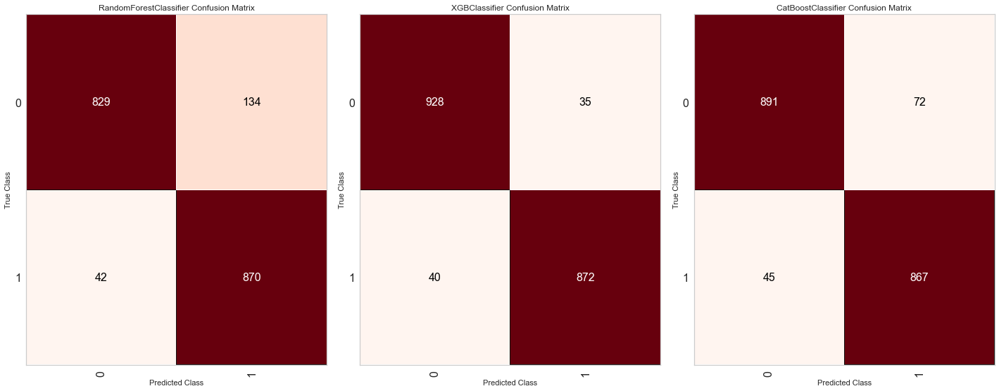

In [622]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8))
plt.rcParams['font.size'] = '16'

viz = ConfusionMatrix((rf_model),classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ConfusionMatrix(xgb_model, classes=['0','1'], ax=ax2, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ConfusionMatrix(wrap(cat_model), classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

### 7.2. Classification Report
 The classification report shows the Precision, Recall and F1 score (harmonic mean between precision and recall).
 
 * Conclusion: XGBoost performed slightly better on metrics, specifically Recall (0.0964).

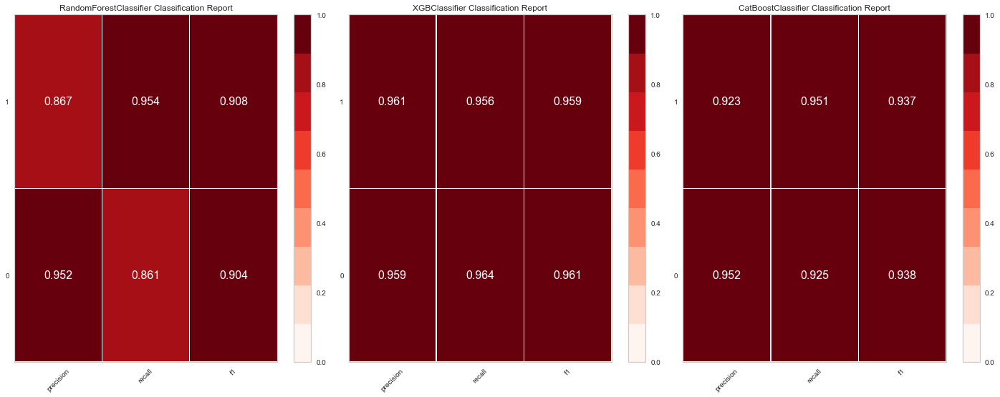

In [623]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8))
plt.rcParams['font.size'] = '16'

viz = ClassificationReport((rf_model),classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ClassificationReport(xgb_model, classes=['0','1'], ax=ax2, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ClassificationReport(wrap(cat_model), classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

### 7.3. ROC AUC Curve
 The Receiver Operating Characteristic Curve shows the performance of a model at all classification thresholds. The Area Under the Curve shows how much the algorithm is capable of distinguishing between classes
 * Conclusion: XGBoost has a slightly better Area Under the Curve of 0.99.

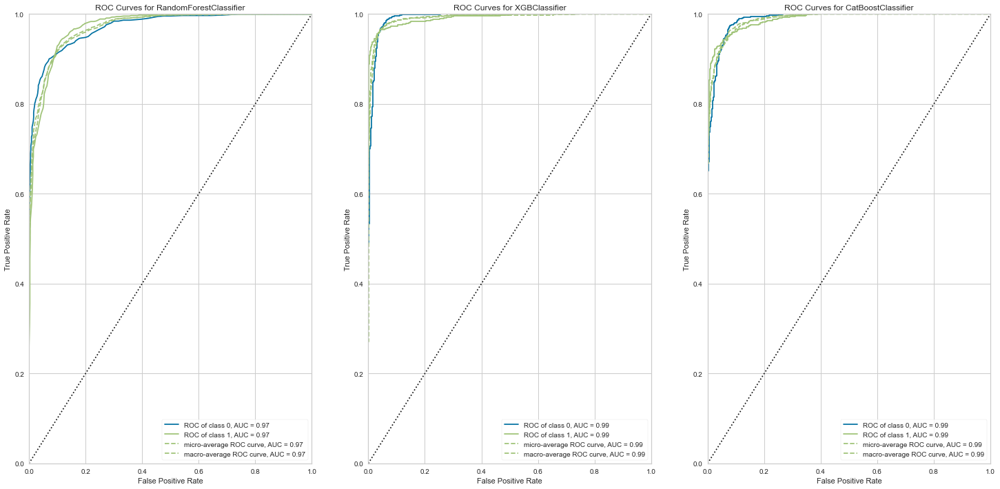

In [614]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(25, 12))

viz = ROCAUC((rf_model), iso_f1_curves=True, classes=['0','1'],ax=ax1, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ROCAUC(xgb_model,iso_f1_curves=True, classes=['0','1'], ax=ax2, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = ROCAUC(wrap(cat_model),iso_f1_curves=True, classes=['0','1'], ax=ax3, cmap='reds')
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

### 7.4. Precision-Recall curve
The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall).

This graph also shows the F1 scores (harmonic mean between precision and recall), therefore, the closer the curve gets to the F1 thresholds the better.
* Conclusion:  XGBoost has a slightly better Average Precision of 0.99

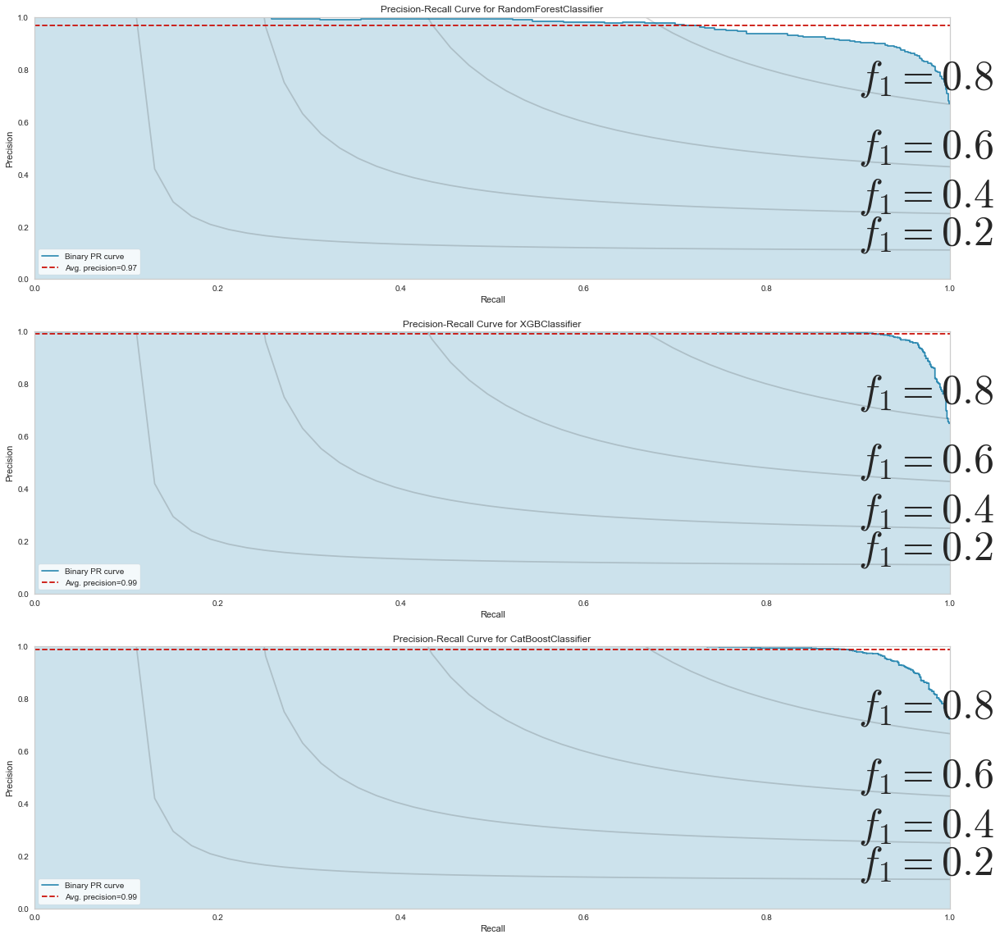

In [621]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 20))

viz = PrecisionRecallCurve((rf_model), iso_f1_curves=True,ax=ax1)
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = PrecisionRecallCurve(xgb_model,iso_f1_curves=True, ax=ax2)
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

viz = PrecisionRecallCurve(wrap(cat_model),iso_f1_curves=True, ax=ax3)
viz.fit(x_train, y_train)
viz.score(x_test, y_test)
g = viz.finalize()

# 8. Hyperparameter Fine Tuning

### Random Search

In [624]:
param = {'n_estimators': [1500, 1700, 2500, 3000, 3500],
         'eta': [0.01, 0.03],
         'max_depth': [3, 5, 9],
         'subsample': [0.1, 0.5, 0.7],
         'colsample_bytree': [0.3, 0.7, 0.9],
         'min_child_weight': [3, 8, 15]}

MAX_EVAL = 5

In [628]:
final_result = pd.DataFrame()

for i in range(MAX_EVAL):
    # chose values for parameters randomly
    hp = {k: random.sample(v,1)[0] for k, v in param.items()}
    print(hp)

{'n_estimators': 1500, 'eta': 0.03, 'max_depth': 3, 'subsample': 0.5, 'colsample_bytree': 0.3, 'min_child_weight': 15}
{'n_estimators': 2500, 'eta': 0.03, 'max_depth': 3, 'subsample': 0.5, 'colsample_bytree': 0.9, 'min_child_weight': 3}
{'n_estimators': 2500, 'eta': 0.01, 'max_depth': 3, 'subsample': 0.7, 'colsample_bytree': 0.7, 'min_child_weight': 15}
{'n_estimators': 1700, 'eta': 0.01, 'max_depth': 5, 'subsample': 0.7, 'colsample_bytree': 0.7, 'min_child_weight': 3}
{'n_estimators': 3000, 'eta': 0.01, 'max_depth': 5, 'subsample': 0.7, 'colsample_bytree': 0.9, 'min_child_weight': 3}


In [634]:
final_result = pd.DataFrame()

for i in range(MAX_EVAL):
    # chose values for parameters randomly
    hp = {k: random.sample(v,1)[0] for k, v in param.items()}
    print(hp)
    
    # model
    model_xgb = XGBClassifier(n_estimators=hp['n_estimators'], 
                              eta=hp['eta'], 
                              max_depth=hp['max_depth'], 
                              subsample=hp['subsample'],
                              colsample_bytee=hp['colsample_bytree'],
                              min_child_weight=hp['min_child_weight']).fit(x_train, y_train)
    
    # predict
    y_hat = model_xgb.predict(x_test)

    print(m.confusion_matrix(y_test, y_hat))
    print(m.classification_report(y_test, y_hat))

{'n_estimators': 1700, 'eta': 0.01, 'max_depth': 5, 'subsample': 0.1, 'colsample_bytree': 0.9, 'min_child_weight': 8}
[17:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:541: 
Parameters: { colsample_bytee } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[736 227]
 [ 88 824]]
              precision    recall  f1-score   support

           0       0.89      0.76      0.82       963
           1       0.78      0.90      0.84    

In [ ]:
ms.cross_validate()